In [1]:
import numpy as np
import pandas as pd
import datetime

from sklearn.metrics import confusion_matrix, classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import mean_squared_error as MSE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import matplotlib.pyplot as plt
import seaborn as sns

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import models, layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPool2D, BatchNormalization, Dropout, Flatten, Dense, Input, MultiHeadAttention, Reshape, Embedding
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.preprocessing import image
from tensorflow.keras.utils import to_categorical
import tensorflow.keras.backend as k
import warnings
warnings.filterwarnings('ignore')

In [ ]:
# use gpu as needed
gpus = tf.config.list_physical_devices('GPU')
if gpus:
  try:
    # Currently, memory growth needs to be the same across GPUs
    for gpu in gpus:
      tf.config.experimental.set_memory_growth(gpu, True)
    logical_gpus = tf.config.list_logical_devices('GPU')
    print(len(gpus), "Physical GPUs,", len(logical_gpus), "Logical GPUs")
  except RuntimeError as e:
    # Memory growth must be set before GPUs have been initialized
    print(e)

1 Physical GPUs, 1 Logical GPUs


I0000 00:00:1760669235.792844    5121 gpu_device.cc:2020] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 2442 MB memory:  -> device: 0, name: NVIDIA GeForce GTX 1060, pci bus id: 0000:01:00.0, compute capability: 6.1


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import os
os.chdir('/content/drive/MyDrive/Colab Notebooks/Deep-learning/A2')

## EDA Functions

In [ ]:
def get_three_classes(x, y):
    def indices_of(class_id):
        indices, _ = np.where(y == float(class_id))
        return indices

    indices = np.concatenate([indices_of(0), indices_of(1), indices_of(2)], axis=0)

    x = x[indices]
    y = y[indices]

    count = x.shape[0]
    indices = np.random.choice(range(count), count, replace=False)

    x = x[indices]
    y = y[indices]

    y = tf.keras.utils.to_categorical(y)

    return x, y

In [ ]:
def show_random_examples(x, y, p):
    indices = np.random.choice(range(x.shape[0]), 10, replace=False)

    x = x[indices]
    y = y[indices]
    p = p[indices]

    plt.figure(figsize=(10, 5))
    for i in range(10):
        plt.subplot(2, 5, i + 1)
        plt.imshow(x[i])
        plt.xticks([])
        plt.yticks([])
        col = 'green' if np.argmax(y[i]) == np.argmax(p[i]) else 'red'
        plt.xlabel(class_names_preview[np.argmax(p[i])], color=col)
    plt.show()

## Research Assignment Reporting Functions

In [ ]:
def plot_history(history):
  losses = history.history['loss']
  accs = history.history['accuracy']
  val_losses = history.history['val_loss']
  val_accs = history.history['val_accuracy']
  epochs = len(losses)

  plt.figure(figsize=(16, 4))
  for i, metrics in enumerate(zip([losses, accs], [val_losses, val_accs], ['Loss', 'Accuracy'])):
    plt.subplot(1, 2, i + 1)
    plt.plot(range(epochs), metrics[0], label='Training {}'.format(metrics[2]))
    plt.plot(range(epochs), metrics[1], label='Validation {}'.format(metrics[2]))
    plt.legend()
  plt.show()

def display_training_curves(training, validation, title, subplot):
  ax = plt.subplot(subplot)
  ax.plot(training)
  ax.plot(validation)
  ax.set_title('model '+ title)
  ax.set_ylabel(title)
  ax.set_xlabel('epoch')
  ax.legend(['training', 'validation'])

In [ ]:
def print_validation_report(y_test, predictions):
    print("Classification Report")
    print(classification_report(y_test, predictions))
    print('Accuracy Score: {}'.format(accuracy_score(y_test, predictions)))
    print('Root Mean Square Error: {}'.format(np.sqrt(MSE(y_test, predictions))))

In [ ]:
def plot_confusion_matrix(y_true, y_pred):
    mtx = confusion_matrix(y_true, y_pred)
    fig, ax = plt.subplots(figsize=(8,6))
    sns.heatmap(mtx, annot=True, fmt='d', linewidths=.75,  cbar=False, ax=ax,cmap='Blues',linecolor='white')
    #  square=True,
    plt.ylabel('true label')
    plt.xlabel('predicted label')

## Loading cifar10 Dataset

The CIFAR-10 dataset consists of 60000 32x32 colour images in 10 classes, with 6000 images per class. There are 50000 training images and 10000 test images.<br>

The dataset is divided into five training batches and one test batch, each with 10000 images. The test batch contains exactly 1000 randomly-selected images from each class. The training batches contain the remaining images in random order, but some training batches may contain more images from one class than another. Between them, the training batches contain exactly 5000 images from each class.


In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 ━━━━━━━━━━━━━━━━━━━━ 6s 0us/step


* Tuple of Numpy arrays: (x_train, y_train), (x_test, y_test).
* x_train, x_test: uint8 arrays of color image data with shapes (num_samples, 32, 32).
* y_train, y_test: uint8 arrays of digit labels (integers in range 0-9)

## EDA Training and Test Datasets

* Imported 50000 examples for training and 10000 examples for test
* Imported 50000 labels for training and 10000 labels for test

In [ ]:
print('train_images:\t{}'.format(x_train.shape))
print('train_labels:\t{}'.format(y_train.shape))
print('test_images:\t\t{}'.format(x_test.shape))
print('test_labels:\t\t{}'.format(y_test.shape))

train_images:	(50000, 32, 32, 3)
train_labels:	(50000, 1)
test_images:		(10000, 32, 32, 3)
test_labels:		(10000, 1)


## Review Labels

In [ ]:
print("First ten labels training dataset:\n {}\n".format(y_train[0:10]))
print("This output the numeric label, need to convert to item description")

First ten labels training dataset:
 [[6]
 [9]
 [9]
 [4]
 [1]
 [1]
 [2]
 [7]
 [8]
 [3]]

This output the numeric label, need to convert to item description


In [ ]:
class_names = ['airplane'
,'automobile'
,'bird'
,'cat'
,'deer'
,'dog'
,'frog'
,'horse'
,'ship'
,'truck']

## Plot Subset of Examples

In [ ]:
x_train_mean = np.mean(x_train, axis=0, keepdims=True)[0]

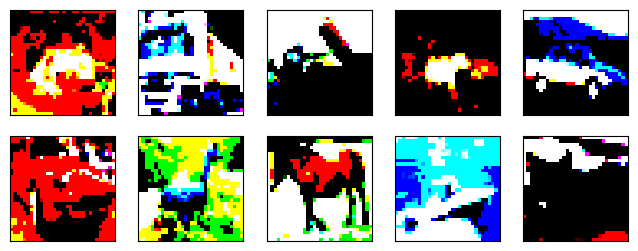

In [ ]:
plt.figure(figsize=(8, 3))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    image_norm=x_train[i]-x_train_mean
    image_norm.round(0)/255
    plt.imshow(image_norm)
    plt.xticks([])
    plt.yticks([])

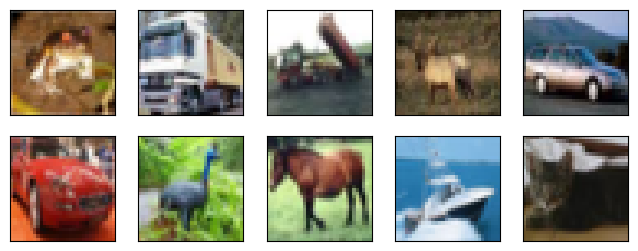

In [ ]:
plt.figure(figsize=(8, 3))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    image=x_train[i]/255
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

## Create Validation Data Set

In [ ]:
x_train_split, x_valid_split, y_train_split, y_valid_split = train_test_split(x_train
                                                                              ,y_train
                                                                              ,test_size=.1
                                                                              ,random_state=42
                                                                              ,shuffle=True)

## Confirm Datasets {Train, Validation, Test}

In [ ]:
print(x_train_split.shape, x_valid_split.shape, x_test.shape)

(45000, 32, 32, 3) (5000, 32, 32, 3) (10000, 32, 32, 3)


## Rescale Examples  {Train, Validation, Test}
Use per-pixel mean subtraction

In [ ]:
x_train_scaled = x_train_split/255
x_valid_scaled = x_valid_split/255
x_test_scaled = x_test/255

In [ ]:
x_train_mean = np.mean(x_train_scaled, axis=0, keepdims=True)[0]
x_train_norm = x_train_scaled - x_train_mean
x_valid_norm = x_valid_scaled - x_train_mean
x_test_norm = x_test_scaled - x_train_mean

## Experiment 1a: DNN with 2 layers

In [ ]:
#! pip install -q -U keras-tuner

In [ ]:
import keras_tuner as kt

In [ ]:
def build_model(hp):
    model = Sequential([
        Input(shape=(32, 32, 3)),
        Flatten(),
        Dense(
            units=hp.Int('units', min_value=100, max_value=500, step=50),
            activation='relu',
            kernel_initializer='he_normal'
        ),
        Dense(units=10, activation='softmax')
    ])

    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=500,
        decay_rate=0.95)

    model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='DNN_2_layers'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 9 Complete [00h 00m 11s]
val_accuracy: 0.4803999960422516

Best val_accuracy So Far: 0.4903999865055084
Total elapsed time: 00h 01m 42s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'units': 250,
 'tuner/epochs': 2,
 'tuner/initial_epoch': 0,
 'tuner/bracket': 2,
 'tuner/round': 0}

In [ ]:
DNN_2_layers = Sequential([
  Input(shape=(32, 32, 3)),
  Flatten(),
  Dense(units=250, activation='relu', kernel_initializer='he_normal'),
  Dense(units=10, activation='softmax')
])

In [ ]:
DNN_2_layers.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)             │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 250)            │       768,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         2,510 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 770,760 (2.94 MB)

 Trainable params: 770,760 (2.94 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=500,
        decay_rate=0.95)

In [ ]:
DNN_2_layers.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = DNN_2_layers.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_2_layers.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

Epoch 1/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.4258 - loss: 1.6448 - val_accuracy: 0.4586 - val_loss: 1.5465
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5101 - loss: 1.4105 - val_accuracy: 0.4730 - val_loss: 1.5246
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5475 - loss: 1.3018 - val_accuracy: 0.4980 - val_loss: 1.4515
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5760 - loss: 1.2229 - val_accuracy: 0.5012 - val_loss: 1.4526
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6016 - loss: 1.1514 - val_accuracy: 0.5046 - val_loss: 1.4460
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6222 - loss: 1.0876 - val_accuracy: 0.5144 - val_loss: 1.4223
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6461 - loss: 1.0289 - val_accuracy: 0.5106 - val_loss: 1.4241
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6664 - loss: 0.9721 - val_accu

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,accuracy,loss,val_accuracy,val_loss
8,0.685,0.921,0.512,1.474
9,0.702,0.873,0.523,1.432
10,0.720,0.826,0.519,1.468
11,0.735,0.783,0.519,1.475
12,0.749,0.746,0.516,1.517


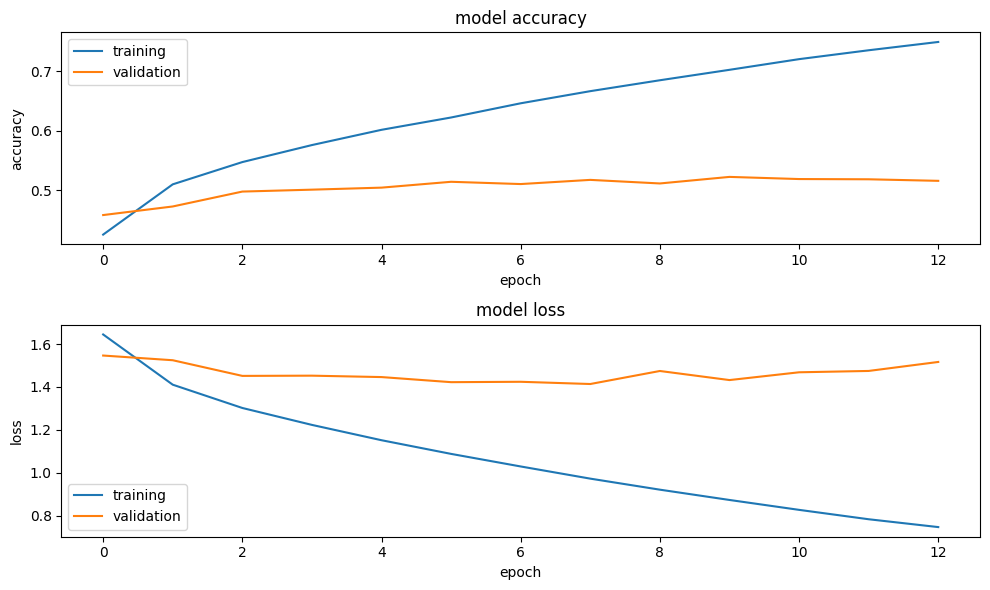

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
preds = DNN_2_layers.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.57      0.55      0.56      1000
           1       0.65      0.60      0.63      1000
           2       0.42      0.39      0.40      1000
           3       0.33      0.33      0.33      1000
           4       0.43      0.53      0.47      1000
           5       0.43      0.40      0.41      1000
           6       0.59      0.51      0.55      1000
           7       0.58      0.61      0.59      1000
           8       0.66      0.65      0.66      1000
           9       0.54      0.61      0.57      1000

    accuracy                           0.52     10000
   macro avg       0.52      0.52      0.52     10000
weighted avg       0.52      0.52      0.52     10000

Accuracy Score: 0.5178
Root Mean Square Error: 3.0178303464575342


## Experiment 1b: DNN with 2 layers regularized

In [ ]:
def build_model(hp):
    model = Sequential([
        Input(shape=(32, 32, 3)),
        Flatten(),
        Dense(
            units=hp.Int('units', min_value=100, max_value=500, step=50),
            kernel_regularizer=tf.keras.regularizers.L2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='LOG')),
            activation='relu',
            kernel_initializer='he_normal'
        ),
        Dense(units=10, activation='softmax')
    ])

    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=500,
        decay_rate=0.95)

    model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='DNN_2_layers_reg'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 30 Complete [00h 00m 48s]
val_accuracy: 0.5455999970436096

Best val_accuracy So Far: 0.5455999970436096
Total elapsed time: 00h 09m 58s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'units': 500,
 'l2_reg': 0.00011607008288598981,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 0,
 'tuner/bracket': 0,
 'tuner/round': 0}

In [ ]:
DNN_2_layers_reg = Sequential([
  Input(shape=(32, 32, 3)),
  Flatten(),
  Dense(units=250, activation='relu', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.000116)),
  Dense(units=10, activation='softmax')
])

In [ ]:
DNN_2_layers_reg.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten (Flatten)               │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 250)            │       768,250 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,510 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 770,760 (2.94 MB)

 Trainable params: 770,760 (2.94 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
DNN_2_layers_reg.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = DNN_2_layers_reg.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_2_layers_reg.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

Epoch 1/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.4252 - loss: 1.7154 - val_accuracy: 0.4504 - val_loss: 1.6471
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5052 - loss: 1.4963 - val_accuracy: 0.4870 - val_loss: 1.5693
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5403 - loss: 1.4078 - val_accuracy: 0.4916 - val_loss: 1.5492
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5656 - loss: 1.3485 - val_accuracy: 0.5076 - val_loss: 1.5183
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5852 - loss: 1.2975 - val_accuracy: 0.5056 - val_loss: 1.5551
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6043 - loss: 1.2550 - val_accuracy: 0.5212 - val_loss: 1.5147
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6206 - loss: 1.2123 - val_accuracy: 0.5204 - val_loss: 1.5217
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6384 - loss: 1.1736 - val_accu

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

In [ ]:
history_df=pd.DataFrame(history_dict)
history_df.tail().round(3)

,accuracy,loss,val_accuracy,val_loss
9,0.667,1.103,0.524,1.538
10,0.683,1.066,0.534,1.525
11,0.697,1.034,0.532,1.550
12,0.707,1.008,0.532,1.549
13,0.723,0.975,0.533,1.558


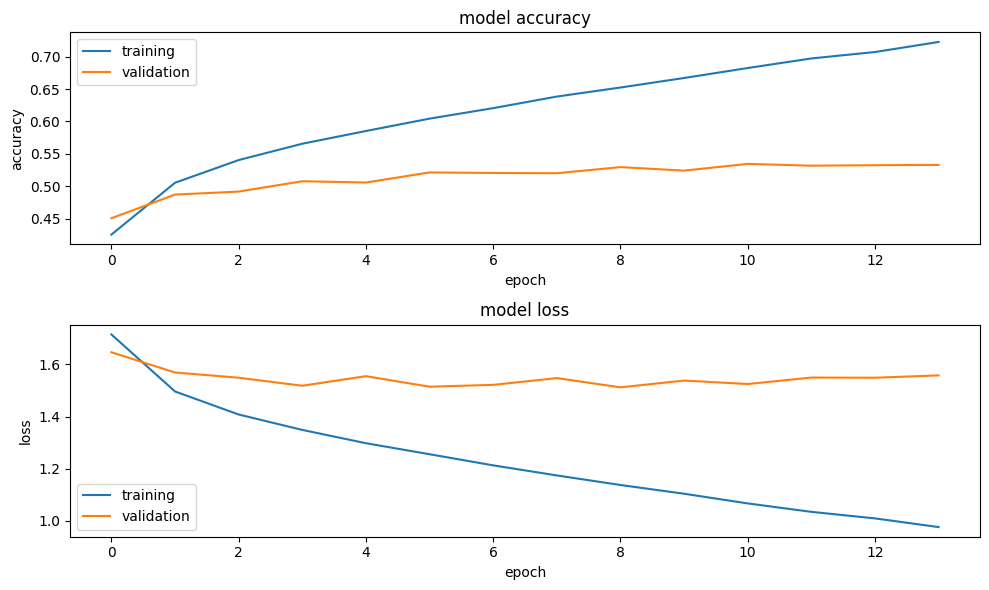

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
preds = DNN_2_layers_reg.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.59      0.66      0.62      1000
           1       0.68      0.61      0.64      1000
           2       0.49      0.37      0.42      1000
           3       0.37      0.37      0.37      1000
           4       0.48      0.44      0.46      1000
           5       0.47      0.40      0.43      1000
           6       0.48      0.73      0.58      1000
           7       0.63      0.58      0.60      1000
           8       0.70      0.64      0.67      1000
           9       0.57      0.62      0.59      1000

    accuracy                           0.54     10000
   macro avg       0.55      0.54      0.54     10000
weighted avg       0.55      0.54      0.54     10000

Accuracy Score: 0.5425
Root Mean Square Error: 2.943874997346185


## Experiment 2a: DNN with 3 layers

In [ ]:
def build_model(hp):
    model = Sequential([
        Input(shape=(32, 32, 3)),
        Flatten(),
        Dense(
            units=hp.Int('units_1', min_value=100, max_value=500, step=50),
            activation='relu',
            kernel_initializer='he_normal'
        ),
        Dense(
            units=hp.Int('units_2', min_value=100, max_value=500, step=50),
            activation='relu',
            kernel_initializer='he_normal'
        ),
        Dense(units=10, activation='softmax')
    ])

    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=500,
        decay_rate=0.95)

    model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='dnn_3_layers_tuning'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 30 Complete [00h 00m 52s]
val_accuracy: 0.5370000004768372

Best val_accuracy So Far: 0.5382000207901001
Total elapsed time: 00h 12m 28s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'units_1': 300,
 'units_2': 450,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 0,
 'tuner/bracket': 0,
 'tuner/round': 0}

In [ ]:
DNN_3_layers = Sequential([
  Input(shape=(32, 32, 3)),
  Flatten(),
  Dense(units=300, activation='relu', kernel_initializer='he_normal'),
  Dense(units=450, activation='relu', kernel_initializer='he_normal'),
  Dense(units=10, activation='softmax')
])

In [ ]:
DNN_3_layers.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)             │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 300)            │       921,900 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 450)            │       135,450 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │         4,510 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,061,860 (4.05 MB)

 Trainable params: 1,061,860 (4.05 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
DNN_3_layers.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = DNN_3_layers.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_3_layers.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

Epoch 1/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.4268 - loss: 1.6320 - val_accuracy: 0.4622 - val_loss: 1.5442
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5088 - loss: 1.3985 - val_accuracy: 0.4890 - val_loss: 1.4571
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5553 - loss: 1.2668 - val_accuracy: 0.5094 - val_loss: 1.4144
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5936 - loss: 1.1592 - val_accuracy: 0.5224 - val_loss: 1.3883
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6329 - loss: 1.0459 - val_accuracy: 0.5336 - val_loss: 1.3969
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.6685 - loss: 0.9446 - val_accuracy: 0.5340 - val_loss: 1.4163
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7075 - loss: 0.8392 - val_accuracy: 0.5314 - val_loss: 1.4402
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7451 - loss: 0.7395 - val_accu

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

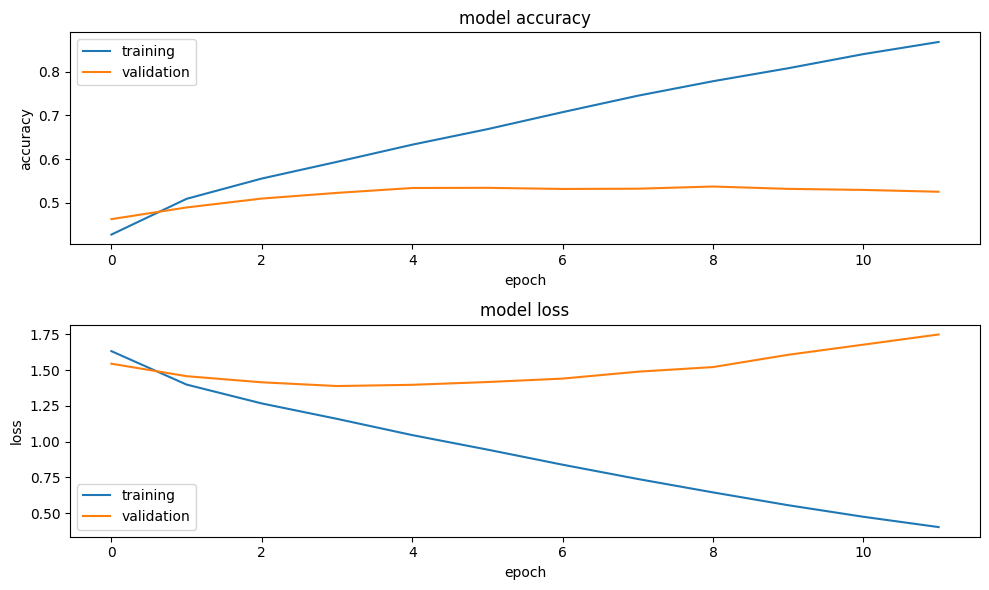

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
preds = DNN_3_layers.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.58      0.63      0.61      1000
           1       0.67      0.65      0.66      1000
           2       0.51      0.35      0.41      1000
           3       0.35      0.40      0.38      1000
           4       0.40      0.52      0.45      1000
           5       0.45      0.42      0.44      1000
           6       0.62      0.52      0.57      1000
           7       0.58      0.60      0.59      1000
           8       0.68      0.70      0.69      1000
           9       0.60      0.60      0.60      1000

    accuracy                           0.54     10000
   macro avg       0.55      0.54      0.54     10000
weighted avg       0.55      0.54      0.54     10000

Accuracy Score: 0.5394
Root Mean Square Error: 2.8864337858333076


## Experiment 2b: DNN with 3 layers regularized

In [ ]:
import keras_tuner as kt

def build_model(hp):
    model = Sequential([
        Input(shape=(32, 32, 3)),
        Flatten(),
        Dense(
            units=hp.Int('units_1', min_value=100, max_value=500, step=50),
            activation='relu',
            kernel_initializer='he_normal',
            kernel_regularizer=tf.keras.regularizers.L2(hp.Float('l2_reg_1', min_value=1e-4, max_value=1e-2, sampling='LOG'))
        ),
        Dense(
            units=hp.Int('units_2', min_value=100, max_value=500, step=50),
            activation='relu',
            kernel_initializer='he_normal',
            kernel_regularizer=tf.keras.regularizers.L2(hp.Float('l2_reg_2', min_value=1e-4, max_value=1e-2, sampling='LOG'))
        ),
        Dense(units=10, activation='softmax')
    ])

    lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
        initial_learning_rate=1e-3,
        decay_steps=500,
        decay_rate=0.95)

    model.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='dnn_3_layers_reg_tuning'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 30 Complete [00h 00m 55s]
val_accuracy: 0.525600016117096

Best val_accuracy So Far: 0.5455999970436096
Total elapsed time: 00h 13m 37s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'units_1': 350,
 'l2_reg_1': 0.0003900298229501787,
 'units_2': 150,
 'l2_reg_2': 0.0008629334695092028,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 0,
 'tuner/bracket': 0,
 'tuner/round': 0}

In [ ]:
DNN_3_layers_reg = Sequential([
  Input(shape=(32, 32, 3)),
  Flatten(),
  Dense(units=350, activation='relu', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.00039)),
  Dense(units=150, activation='relu', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.00086)),
  Dense(units=10, activation='softmax')
])

In [ ]:
DNN_3_layers_reg.summary()

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ flatten_2 (Flatten)             │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 350)            │     1,075,550 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 150)            │        52,650 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 10)             │         1,510 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,129,710 (4.31 MB)

 Trainable params: 1,129,710 (4.31 MB)

 Non-trainable params: 0 (0.00 B)

In [ ]:
DNN_3_layers_reg.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = DNN_3_layers_reg.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_3_layers_reg.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

Epoch 1/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 6s 5ms/step - accuracy: 0.4214 - loss: 2.0647 - val_accuracy: 0.4466 - val_loss: 1.9041
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.4886 - loss: 1.7395 - val_accuracy: 0.4728 - val_loss: 1.7539
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5197 - loss: 1.6116 - val_accuracy: 0.4812 - val_loss: 1.6784
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5383 - loss: 1.5440 - val_accuracy: 0.5012 - val_loss: 1.6450
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5544 - loss: 1.4873 - val_accuracy: 0.4922 - val_loss: 1.6633
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5646 - loss: 1.4464 - val_accuracy: 0.5132 - val_loss: 1.5947
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5817 - loss: 1.4022 - val_accuracy: 0.5120 - val_loss: 1.5952
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.5966 - loss: 1.3637 - val_accu

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

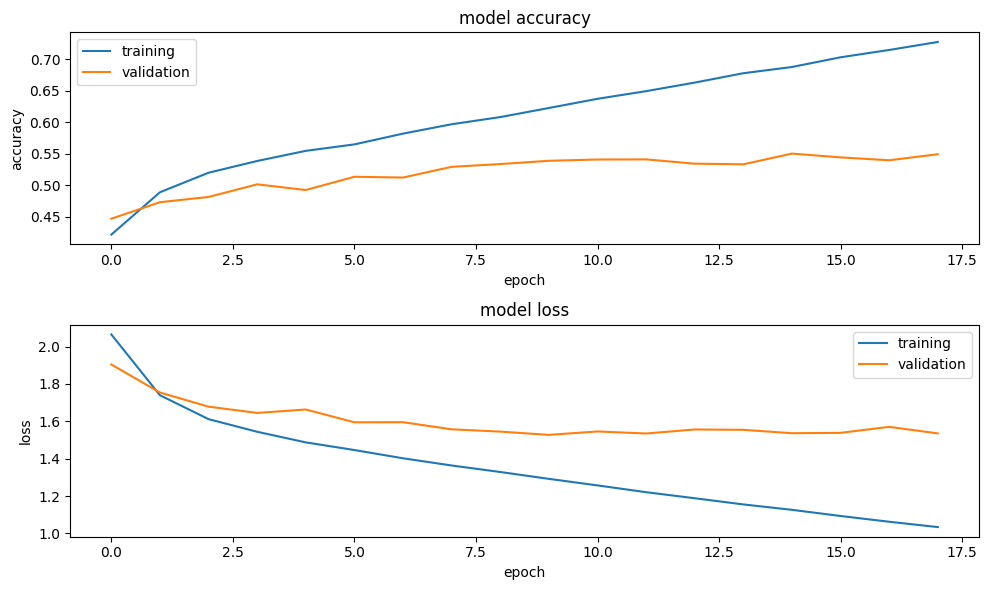

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
preds = DNN_3_layers_reg.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.61      0.59      0.60      1000
           1       0.71      0.63      0.67      1000
           2       0.46      0.44      0.45      1000
           3       0.39      0.39      0.39      1000
           4       0.47      0.51      0.49      1000
           5       0.50      0.40      0.45      1000
           6       0.58      0.64      0.61      1000
           7       0.61      0.63      0.62      1000
           8       0.61      0.74      0.67      1000
           9       0.61      0.60      0.60      1000

    accuracy                           0.56     10000
   macro avg       0.56      0.56      0.55     10000
weighted avg       0.56      0.56      0.55     10000

Accuracy Score: 0.5565
Root Mean Square Error: 2.9068023668629417


## Experiment 3a: CNN with 2 convolution/max pooling layers

In [ ]:
def build_model(hp):
    model = Sequential([
        Input([32, 32, 3]),
        Conv2D(filters=hp.Int('conv_1_filters', min_value=32, max_value=256, step=32),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Conv2D(filters=hp.Int('conv_2_filters', min_value=64, max_value=512, step=64),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Flatten(),
        Dense(units=hp.Int('dense_units', min_value=128, max_value=512, step=64),
              activation='relu', kernel_initializer = 'he_normal'),
        BatchNormalization(),
        Dense(units=10, activation='softmax')
    ])

    model.compile(optimizer='nadam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='cnn_2conv_2pool_tuning'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 25 Complete [00h 03m 18s]
val_accuracy: 0.7405999898910522

Best val_accuracy So Far: 0.7558000087738037
Total elapsed time: 17h 02m 53s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'conv_1_filters': 224,
 'conv_2_filters': 448,
 'dense_units': 256,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 4,
 'tuner/bracket': 1,
 'tuner/round': 1,
 'tuner/trial_id': '0014'}

In [ ]:
Conv_2_Pool_2 =Sequential([
  Input([32,32,3]),
  Conv2D(filters=224, kernel_size=(3, 3), strides=(1, 1), activation='relu',kernel_initializer='he_normal'),
  MaxPool2D((2, 2),strides=2),
  Conv2D(filters=448, kernel_size=(3, 3), strides=(1, 1), activation='relu',kernel_initializer='he_normal'),
  MaxPool2D((2, 2),strides=2),
  Flatten(),
  Dense(units=256,activation='relu', kernel_initializer = 'he_normal'),
  BatchNormalization(),
  Dense(units=10, activation='softmax')
])

In [ ]:
Conv_2_Pool_2.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 224)    │         6,272 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 224)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 448)    │       903,616 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 448)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 16128)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │     4,129,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,042,506 (19.24 MB)

 Trainable params: 5,041,994 (19.23 MB)

 Non-trainable params: 512 (2.00 KB)

In [ ]:
Conv_2_Pool_2.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = Conv_2_Pool_2.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("Conv_2_Pool_2_he.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

2025-10-15 22:17:22.698378: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 552960000 exceeds 10% of free system memory.


Epoch 1/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.5847 - loss: 1.1980 - val_accuracy: 0.4982 - val_loss: 1.6904
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 28ms/step - accuracy: 0.7082 - loss: 0.8489 - val_accuracy: 0.6858 - val_loss: 0.9034
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.7703 - loss: 0.6688 - val_accuracy: 0.7386 - val_loss: 0.7422
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - accuracy: 0.8257 - loss: 0.5028 - val_accuracy: 0.7316 - val_loss: 0.7960
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 26ms/step - accuracy: 0.8799 - loss: 0.3457 - val_accuracy: 0.7302 - val_loss: 0.8635
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.9301 - loss: 0.2112 - val_accuracy: 0.7438 - val_loss: 0.8688
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.9643 - loss: 0.1118 - val_accuracy: 0.7380 - val_loss: 0.9986
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 19s 27ms/step - accuracy: 0.9823 - loss: 0

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

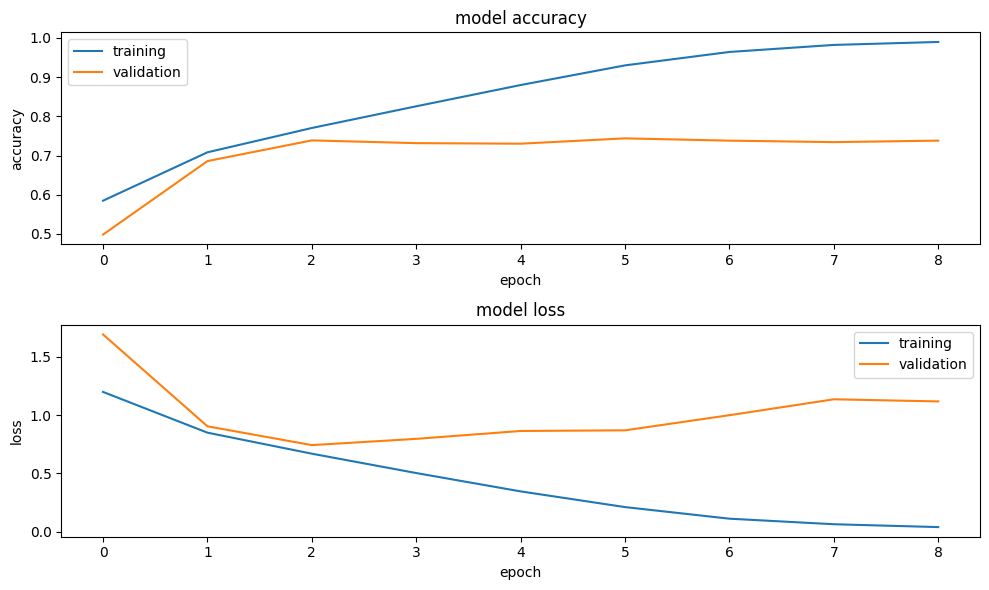

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
preds = Conv_2_Pool_2.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.69      0.81      0.74      1000
           1       0.90      0.79      0.84      1000
           2       0.72      0.59      0.65      1000
           3       0.57      0.57      0.57      1000
           4       0.62      0.82      0.71      1000
           5       0.67      0.66      0.66      1000
           6       0.89      0.69      0.78      1000
           7       0.80      0.76      0.78      1000
           8       0.78      0.86      0.82      1000
           9       0.82      0.81      0.82      1000

    accuracy                           0.74     10000
   macro avg       0.75      0.74      0.74     10000
weighted avg       0.75      0.74      0.74     10000

Accuracy Score: 0.7365
Root Mean Square Error: 2.125864530020669


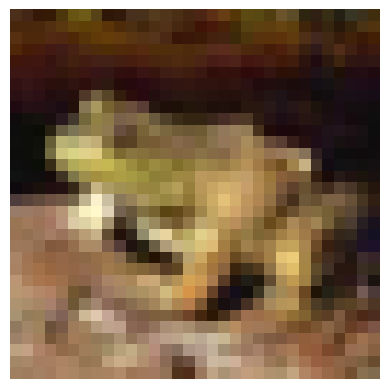

In [ ]:
img = x_train_split[200]
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

plt.imshow(img, cmap='viridis')
plt.axis('off')
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


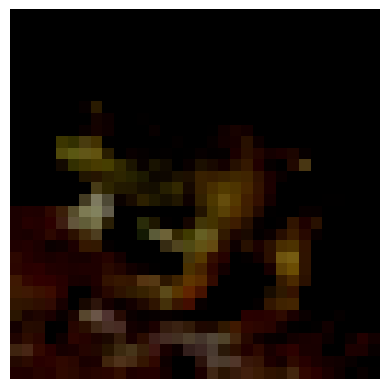

In [ ]:
img = x_train_norm[200]
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

plt.imshow(img, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in Conv_2_Pool_2.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=Conv_2_Pool_2.inputs, outputs=layer_outputs)

In [ ]:
activations = activation_model.predict(img_tensor)
len(activations)

2025-10-10 18:05:39.972587: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[1,448,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,224,15,15]{3,2,1,0}, f32[448,224,3,3]{3,2,1,0}, f32[448]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step


8

In [ ]:
layer_names = []
for layer in Conv_2_Pool_2.layers:
    layer_names.append(layer.name)

layer_names

['conv2d_2',
 'max_pooling2d_2',
 'conv2d_3',
 'max_pooling2d_3',
 'flatten_1',
 'dense_2',
 'batch_normalization_1',
 'dense_3']

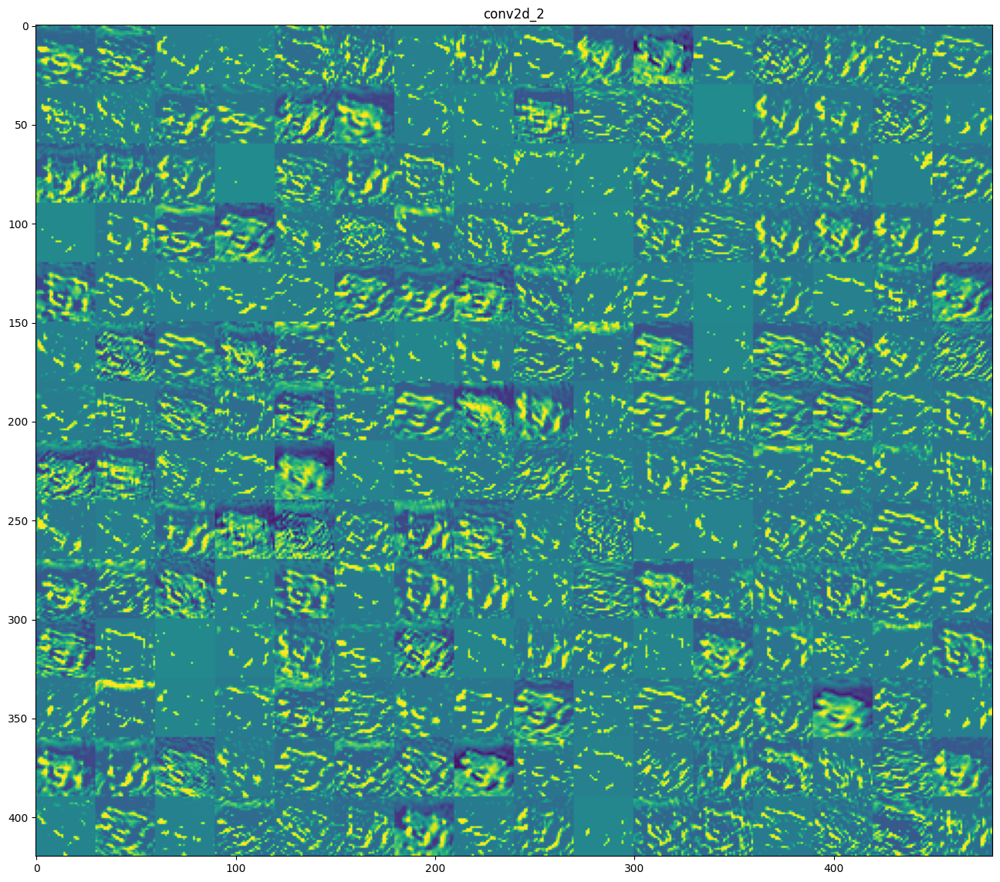

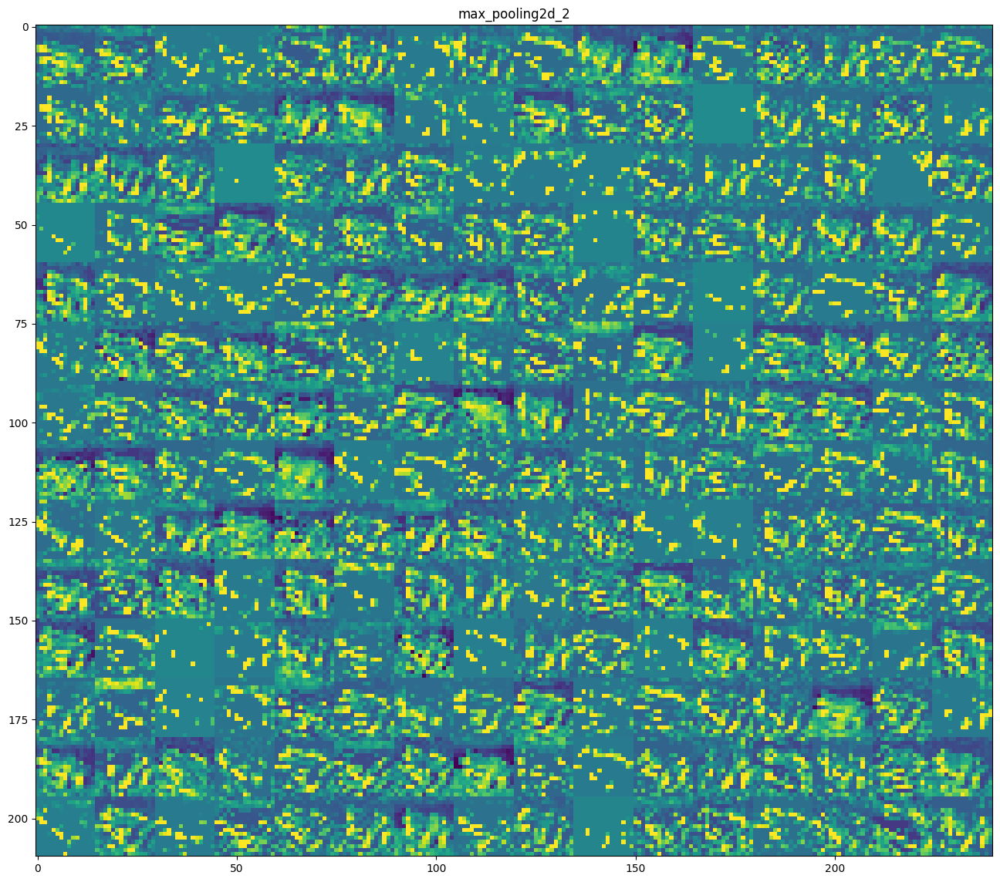

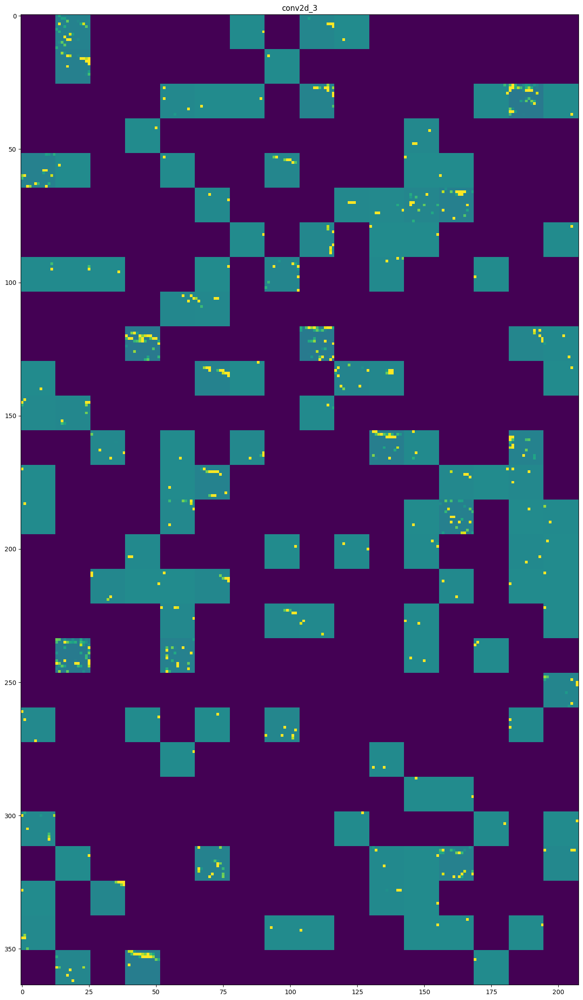

In [ ]:
layer_names = []
for layer in Conv_2_Pool_2.layers[:3]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show();

## Experiment 3b: CNN with 2 convolution/max pooling layers regularized

In [ ]:
def build_model(hp):
    model = Sequential([
        Input([32, 32, 3]),
        Conv2D(filters=hp.Int('conv_1_filters', min_value=32, max_value=256, step=32),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Dropout(hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1)),
        Conv2D(filters=hp.Int('conv_2_filters', min_value=64, max_value=512, step=64),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Dropout(hp.Float('dropout_2', min_value=0.2, max_value=0.5, step=0.1)),
        Flatten(),
        Dense(units=hp.Int('dense_units', min_value=128, max_value=512, step=64), kernel_initializer = 'he_normal',
              activation='relu', kernel_regularizer=tf.keras.regularizers.L2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='LOG'))),
        BatchNormalization(),
        Dropout(hp.Float('dropout_3', min_value=0.2, max_value=0.5, step=0.1)),
        Dense(units=10, activation='softmax')
    ])

    model.compile(optimizer='nadam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='cnn_2conv_2pool_regularization_tuning'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 30 Complete [00h 03m 12s]
val_accuracy: 0.7512000203132629

Best val_accuracy So Far: 0.7685999870300293
Total elapsed time: 03h 16m 13s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'conv_1_filters': 256,
 'dropout_1': 0.4,
 'conv_2_filters': 384,
 'dropout_2': 0.30000000000000004,
 'dense_units': 384,
 'l2_reg': 0.0001524376130469971,
 'dropout_3': 0.4,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 4,
 'tuner/bracket': 1,
 'tuner/round': 1,
 'tuner/trial_id': '0018'}

In [ ]:
Conv_2_Pool_2_reg =Sequential([
  Input([32,32,3]),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.4),
  Conv2D(filters=384, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.3),
  Flatten(),
  Dense(units=384,activation='relu', kernel_initializer = 'he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.00015)),
  BatchNormalization(),
  Dropout(0.4),
  Dense(units=10, activation='softmax')
])

In [ ]:
Conv_2_Pool_2_reg.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 30, 30, 256)    │         7,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 15, 15, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 15, 15, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 13, 13, 384)    │       885,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 6, 6, 384)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 6, 6, 384)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 13824)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 384)            │     5,308,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 384)            │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 384)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 10)             │         3,850 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,206,474 (23.68 MB)

 Trainable params: 6,205,706 (23.67 MB)

 Non-trainable params: 768 (3.00 KB)

In [ ]:
Conv_2_Pool_2_reg.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = Conv_2_Pool_2_reg.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("Conv_2_Pool_2_reg.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

Epoch 1/200


2025-10-10 21:38:54.524181: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,384,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,256,15,15]{3,2,1,0}, f32[384,256,3,3]{3,2,1,0}, f32[384]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-10 21:38:55.106467: W external/local_xla/xla/tsl/framework/bfc_allocator.cc:310] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.01GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


704/704 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.4087 - loss: 1.8653

2025-10-10 21:39:21.118137: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,384,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,256,15,15]{3,2,1,0}, f32[384,256,3,3]{3,2,1,0}, f32[384]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}


704/704 ━━━━━━━━━━━━━━━━━━━━ 31s 36ms/step - accuracy: 0.4923 - loss: 1.5939 - val_accuracy: 0.5940 - val_loss: 1.2977
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.6326 - loss: 1.2133 - val_accuracy: 0.6656 - val_loss: 1.1473
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.6906 - loss: 1.0948 - val_accuracy: 0.6128 - val_loss: 1.3739
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.7254 - loss: 1.0297 - val_accuracy: 0.7082 - val_loss: 1.0821
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.7536 - loss: 0.9761 - val_accuracy: 0.7218 - val_loss: 1.0434
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 20s 29ms/step - accuracy: 0.7732 - loss: 0.9384 - val_accuracy: 0.6962 - val_loss: 1.1874
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 21s 30ms/step - accuracy: 0.8020 - loss: 0.8814 - val_accuracy: 0.7482 - val_loss: 1.0208
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 27s 38ms/step - accuracy: 0.8193 - loss: 0.8350 - val_

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

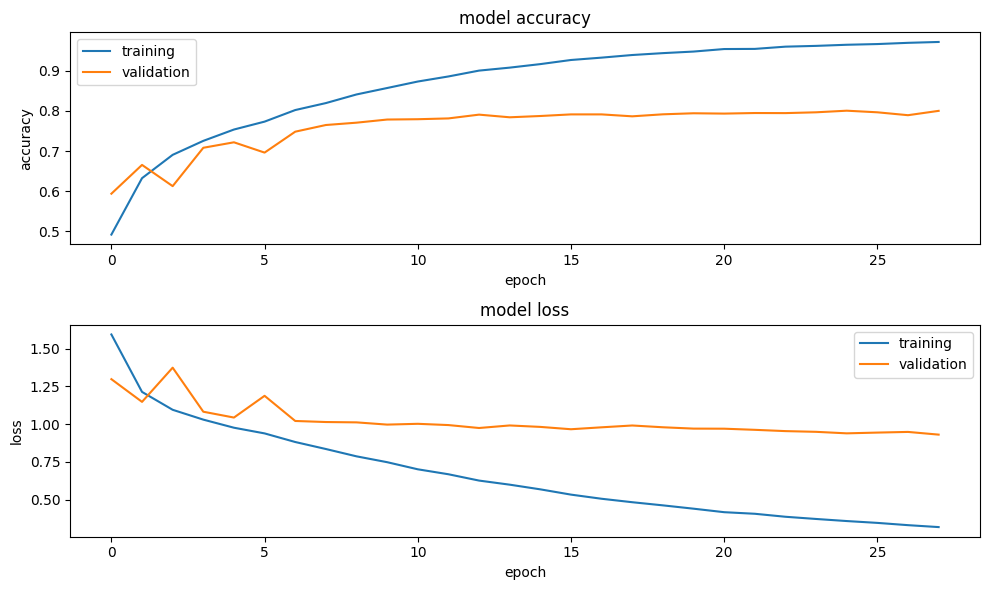

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
Conv_2_Pool_2_reg = tf.keras.models.load_model('Conv_2_Pool_2_reg.keras')

In [ ]:
preds = Conv_2_Pool_2_reg.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 80s 251ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.83      0.81      0.82      1000
           1       0.90      0.88      0.89      1000
           2       0.71      0.72      0.72      1000
           3       0.66      0.61      0.63      1000
           4       0.78      0.81      0.79      1000
           5       0.72      0.72      0.72      1000
           6       0.80      0.89      0.84      1000
           7       0.85      0.84      0.84      1000
           8       0.88      0.88      0.88      1000
           9       0.88      0.85      0.86      1000

    accuracy                           0.80     10000
   macro avg       0.80      0.80      0.80     10000
weighted avg       0.80      0.80      0.80     10000

Accuracy Score: 0.8003
Root Mean Square Error: 1.8338484124921557


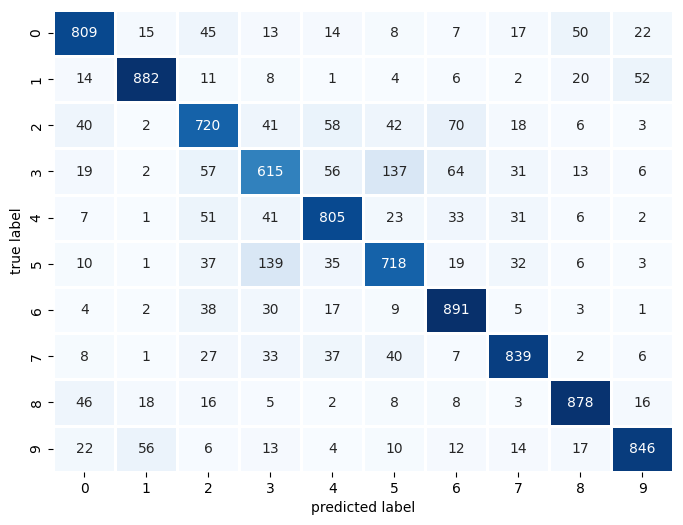

In [ ]:
plot_confusion_matrix(y_test,preds)

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in Conv_2_Pool_2_reg.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=Conv_2_Pool_2_reg.inputs, outputs=layer_outputs)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


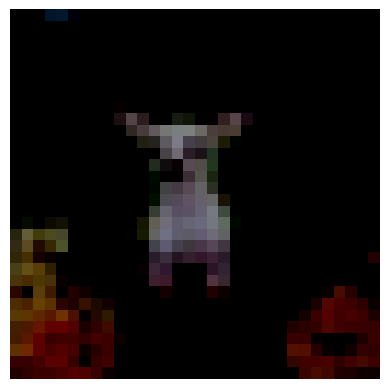

In [ ]:
img = x_train_norm[1040]
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

plt.imshow(img, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
activations = activation_model.predict(img_tensor)
len(activations)

2025-10-10 22:08:35.519694: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[1,384,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,256,15,15]{3,2,1,0}, f32[384,256,3,3]{3,2,1,0}, f32[384]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}


1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


8

In [ ]:
layer_names = []
for layer in Conv_2_Pool_2_reg.layers:
    layer_names.append(layer.name)

layer_names

['conv2d_2',
 'max_pooling2d_2',
 'dropout_3',
 'conv2d_3',
 'max_pooling2d_3',
 'dropout_4',
 'flatten_1',
 'dense_2',
 'batch_normalization_1',
 'dropout_5',
 'dense_3']

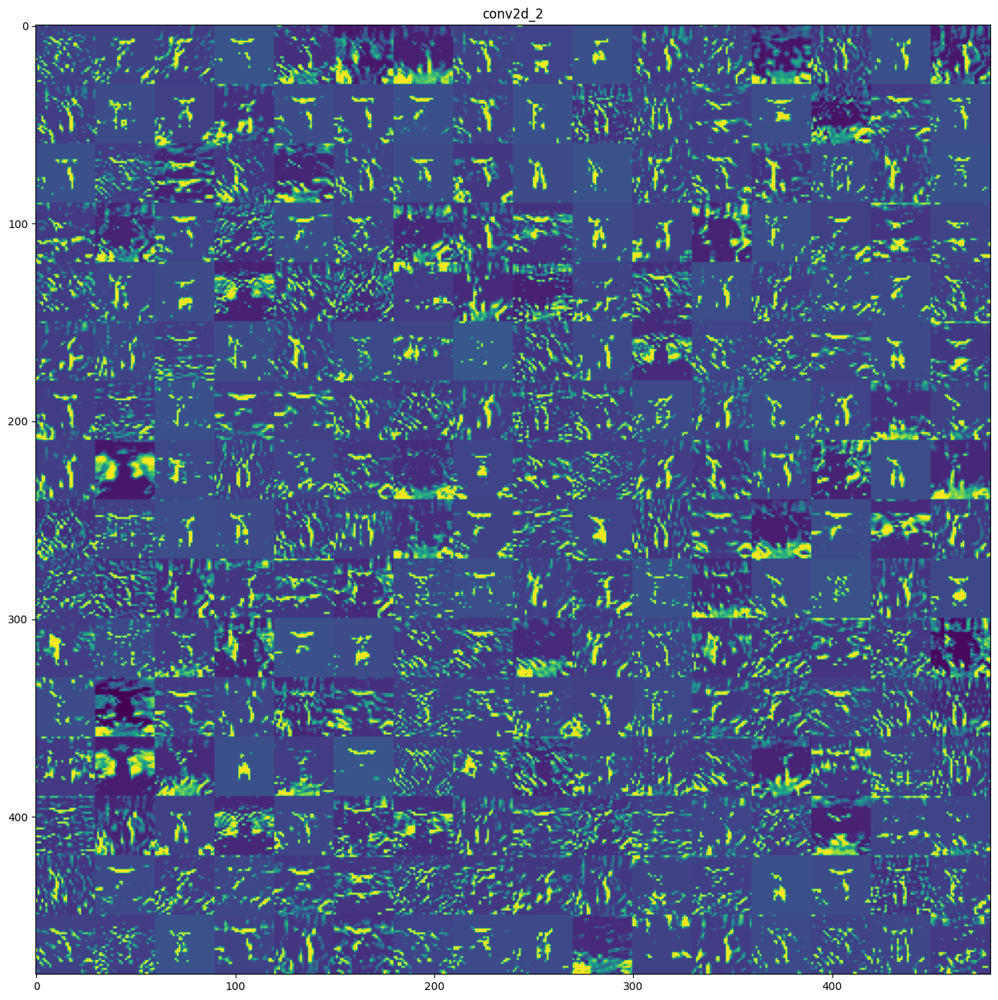

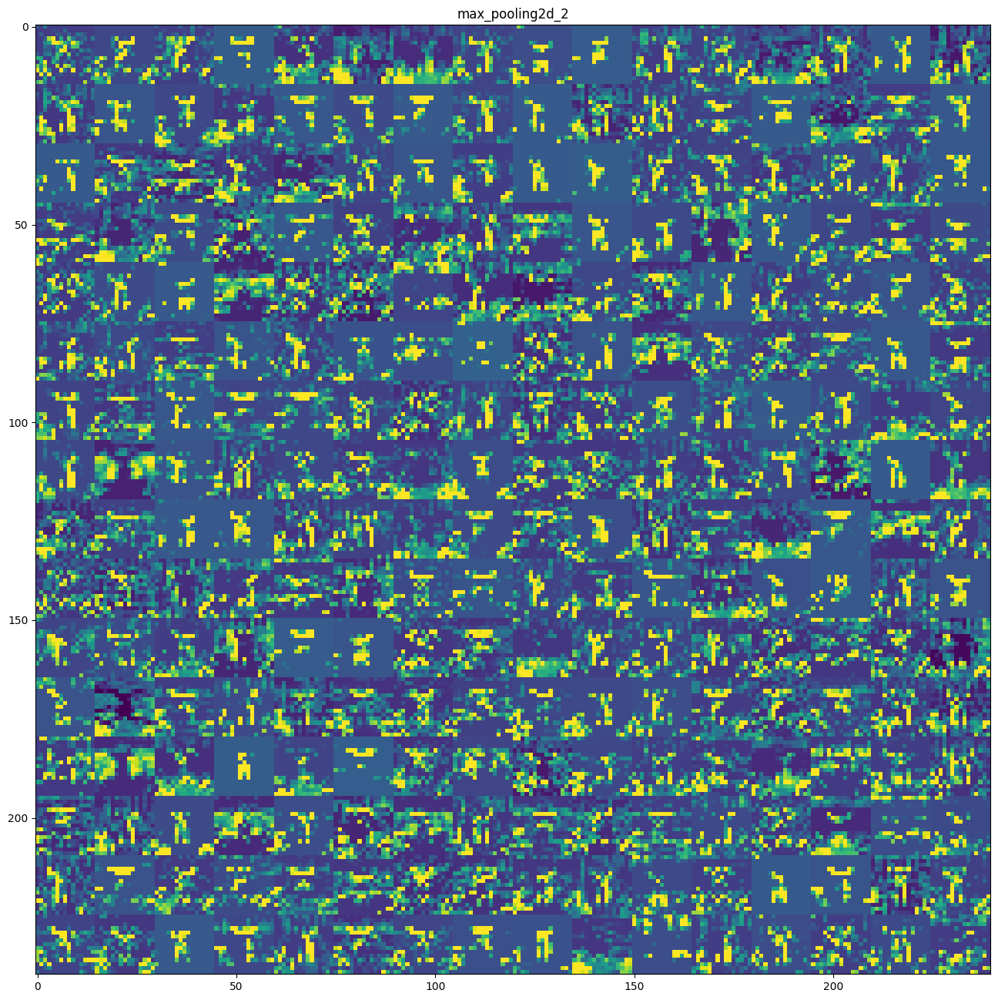

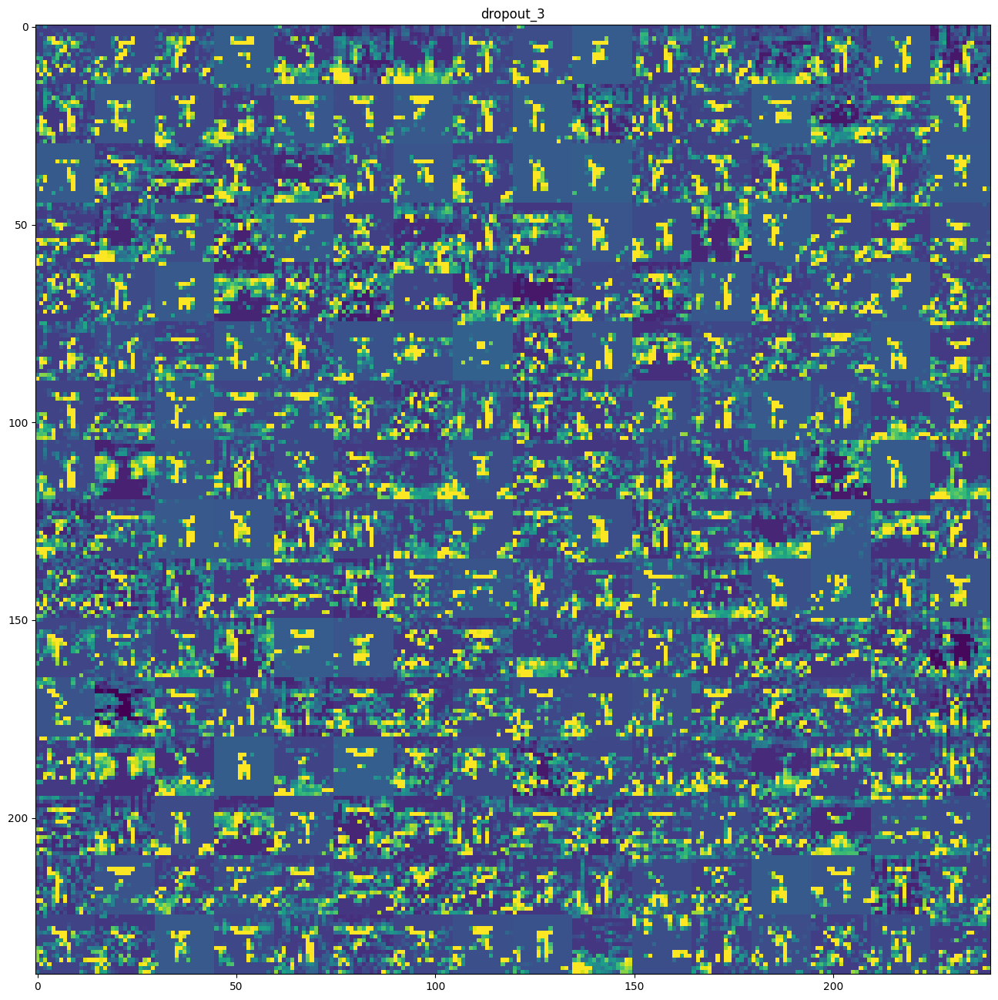

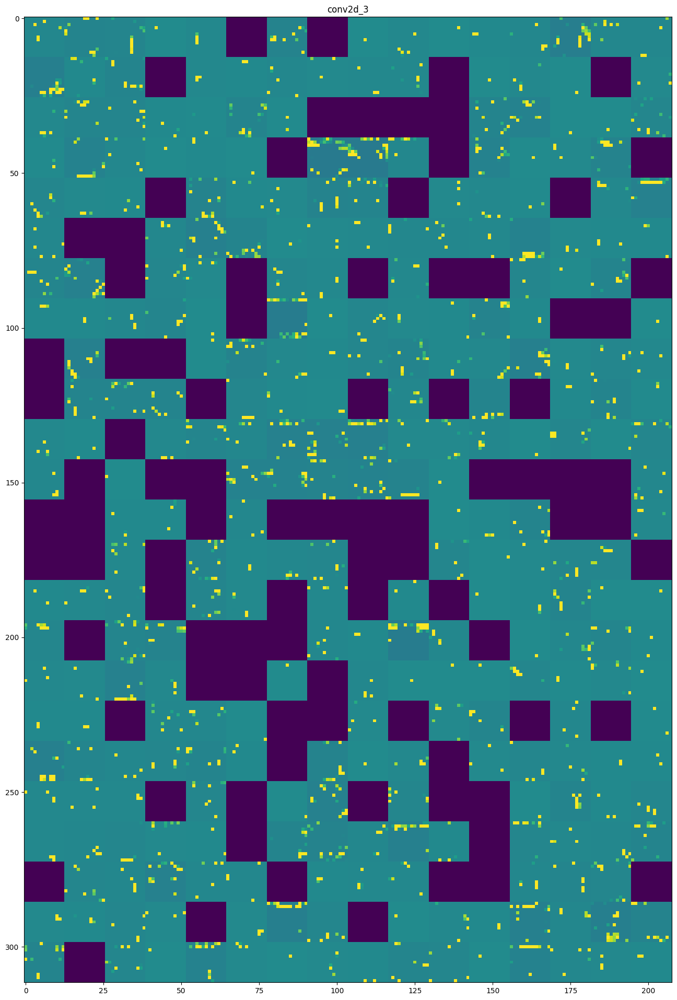

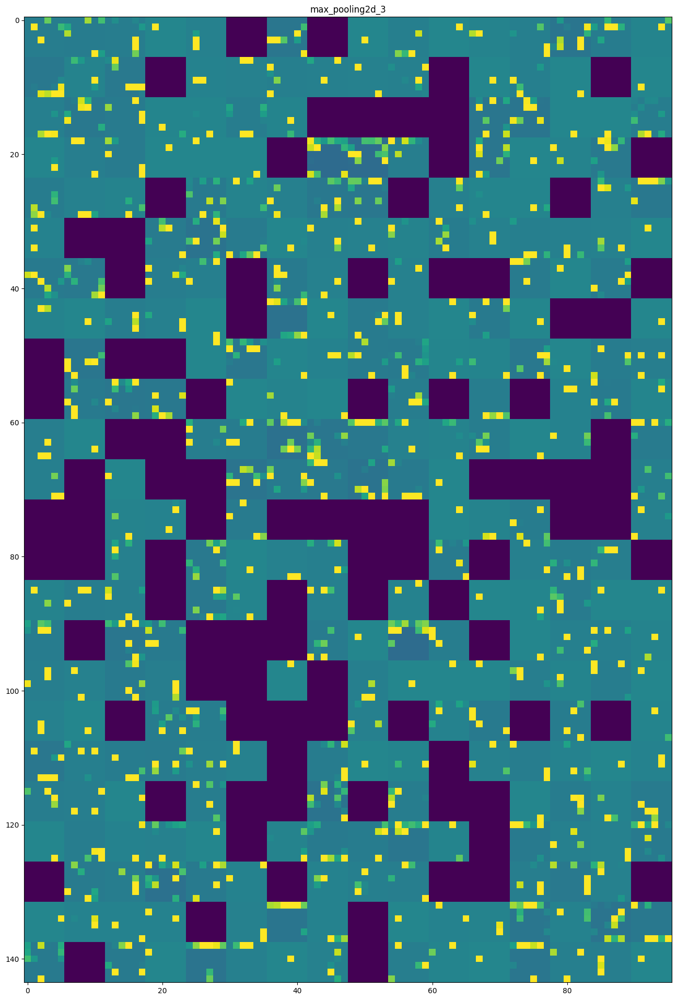

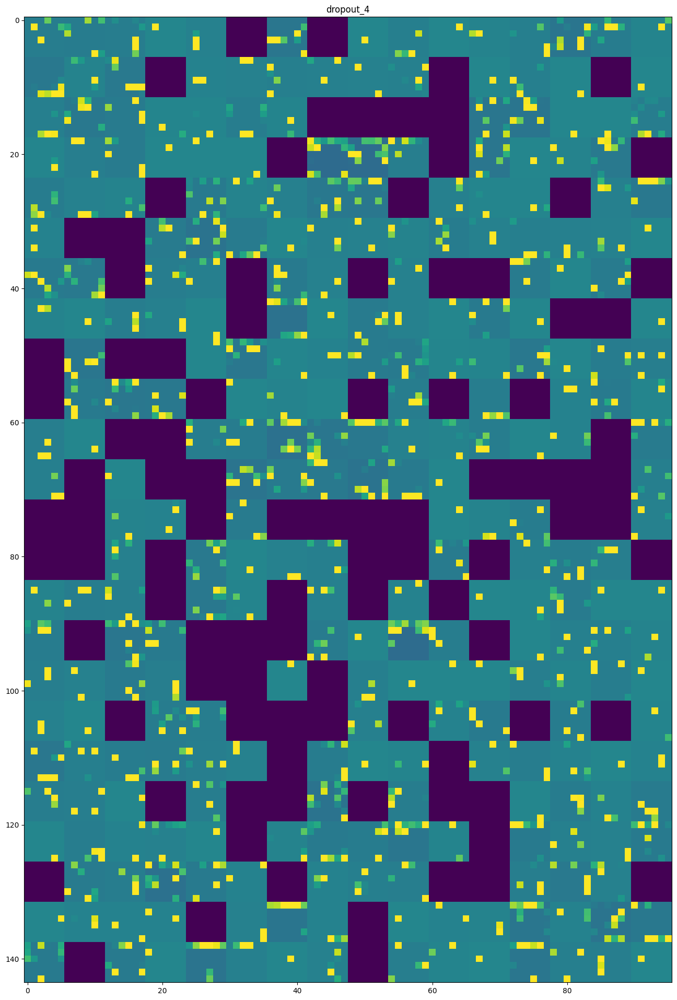

In [ ]:
layer_names = []
for layer in Conv_2_Pool_2_reg.layers[:6]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show();

In [ ]:
layer_name = 'dense_2'
layer_output = Conv_2_Pool_2_reg.get_layer(layer_name).output
intermediate_model = models.Model(
    inputs=Conv_2_Pool_2_reg.inputs, outputs=layer_output
)
activations = intermediate_model.predict(x_test_norm)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 5ms/step


In [ ]:
activation_data = {}
for k in range(0,384):
    activation_data[f"act_val_{k}"] = activations[:,k]

activation_df = pd.DataFrame(activation_data)
activation_df.head(15).round(3).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
act_val_0,0.000,0.577,0.459,0.090,0.000,0.000,1.810,0.000,0.000,0.783,0.000,1.533,0.000,0.092,1.382
act_val_1,1.122,0.000,0.325,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.640,0.752
act_val_2,0.000,0.000,0.000,0.000,1.097,0.884,0.320,0.021,0.000,0.000,0.000,0.000,0.308,0.000,0.000
act_val_3,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
act_val_4,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.178,0.000,0.000,0.694,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
act_val_379,0.101,0.000,0.000,0.000,0.469,0.436,0.000,0.000,0.534,0.000,0.000,0.000,0.000,0.000,0.000
act_val_380,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.398,0.000,0.000,0.000,0.000
act_val_381,0.000,0.000,0.157,0.060,0.000,0.000,0.978,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
act_val_382,0.000,0.787,0.394,1.924,0.009,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [ ]:
from sklearn.manifold import TSNE
import matplotlib as mpl

In [ ]:
%%time
tsne = TSNE(n_components=2
            ,init='pca'
            ,learning_rate='auto'
            ,verbose=0
            ,perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(activation_df)

CPU times: user 42.8 s, sys: 0 ns, total: 42.8 s
Wall time: 43.7 s


In [ ]:
tsne_results = (tsne_results - tsne_results.min()) / (tsne_results.max() - tsne_results.min())

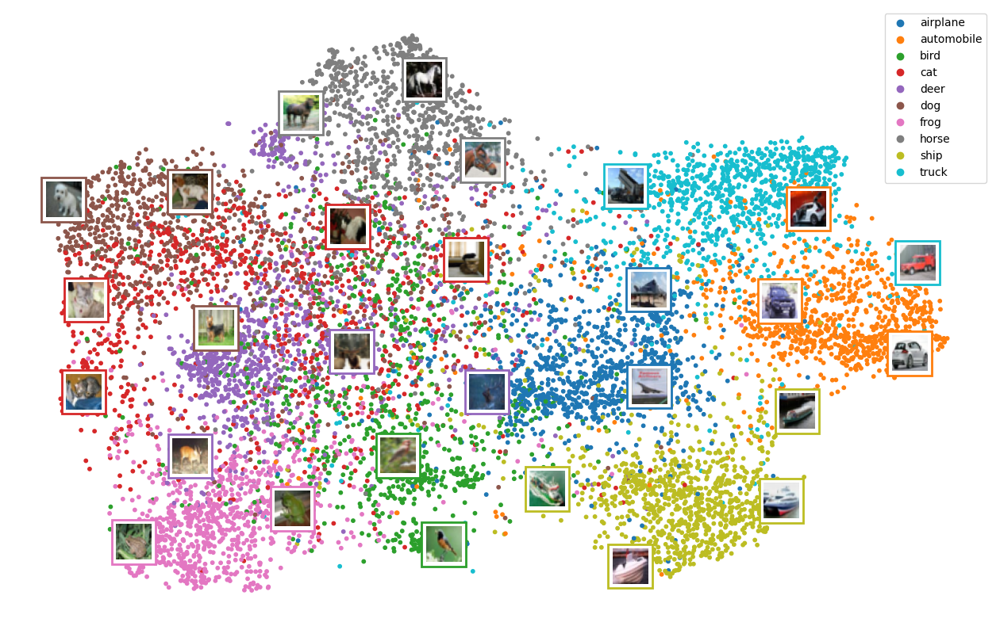

In [ ]:
cmap = plt.cm.tab10
plt.figure(figsize=(16,10))
scatter=plt.scatter(tsne_results[:,0],tsne_results[:,1], c=y_test, s=10, cmap=cmap)
plt.legend(handles=scatter.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_test[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_test[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

## Experiment 4a: CNN with 3 convolution/max pooling layers

In [ ]:
def build_model(hp):
    model = Sequential([
        Input([32, 32, 3]),
        Conv2D(filters=hp.Int('conv_1_filters', min_value=32, max_value=256, step=32),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Conv2D(filters=hp.Int('conv_2_filters', min_value=64, max_value=512, step=64),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Conv2D(filters=hp.Int('conv_3_filters', min_value=128, max_value=1024, step=128),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Flatten(),
        Dense(units=hp.Int('dense_units', min_value=128, max_value=512, step=64),
              activation='relu', kernel_initializer = 'he_normal'),
        BatchNormalization(),
        Dense(units=10, activation='softmax')
    ])

    model.compile(optimizer='nadam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='cnn_3conv_3pool_tuning'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 30 Complete [00h 14m 11s]
val_accuracy: 0.7681999802589417

Best val_accuracy So Far: 0.7689999938011169
Total elapsed time: 02h 06m 10s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'conv_1_filters': 128,
 'conv_2_filters': 512,
 'conv_3_filters': 768,
 'dense_units': 256,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 4,
 'tuner/bracket': 1,
 'tuner/round': 1,
 'tuner/trial_id': '0019'}

In [ ]:
Conv_3_Pool_3 =Sequential([
  Input([32,32,3]),
  Conv2D(filters=120, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Conv2D(filters=512, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Conv2D(filters=768, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Flatten(),
  Dense(units=256,activation='relu', kernel_initializer = 'he_normal'),
  BatchNormalization(),
  Dense(units=10, activation='softmax')
])

In [ ]:
Conv_3_Pool_3.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 120)    │         3,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 120)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 512)    │       553,472 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 768)      │     3,539,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 2, 2, 768)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 3072)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 256)            │       786,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 256)            │         1,024 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,886,826 (18.64 MB)

 Trainable params: 4,886,314 (18.64 MB)

 Non-trainable params: 512 (2.00 KB)

In [ ]:
Conv_3_Pool_3.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = Conv_3_Pool_3.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("Conv_3_Pool_3.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

Epoch 1/200


2025-10-11 10:03:40.655812: I external/local_xla/xla/service/service.cc:163] XLA service 0x78fa90004ab0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-10-11 10:03:40.655848: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce GTX 1060, Compute Capability 6.1
2025-10-11 10:03:40.738578: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-11 10:03:40.936312: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90300
2025-10-11 10:03:41.488504: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,512,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,120,15,15]{3,2,1,0}, f32[512,120,3,3]{3,2,1,0}, f32[512]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cud

  5/704 ━━━━━━━━━━━━━━━━━━━━ 25s 36ms/step - accuracy: 0.1442 - loss: 2.7712

I0000 00:00:1760195025.930010   54332 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


703/704 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.4902 - loss: 1.4401

2025-10-11 10:04:11.050460: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[8,512,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,120,15,15]{3,2,1,0}, f32[512,120,3,3]{3,2,1,0}, f32[512]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-11 10:04:11.180124: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[8,768,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,512,6,6]{3,2,1,0}, f32[768,512,3,3]{3,2,1,0}, f32[768]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward",

704/704 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.4903 - loss: 1.4398

2025-10-11 10:04:13.857171: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,512,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,120,15,15]{3,2,1,0}, f32[512,120,3,3]{3,2,1,0}, f32[512]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-11 10:04:14.289926: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,768,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,512,6,6]{3,2,1,0}, f32[768,512,3,3]{3,2,1,0}, f32[768]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForwa

704/704 ━━━━━━━━━━━━━━━━━━━━ 38s 44ms/step - accuracy: 0.5803 - loss: 1.1981 - val_accuracy: 0.5746 - val_loss: 1.2177
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.7282 - loss: 0.7941 - val_accuracy: 0.6910 - val_loss: 0.9037
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.8010 - loss: 0.5801 - val_accuracy: 0.7358 - val_loss: 0.7808
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 26s 38ms/step - accuracy: 0.8656 - loss: 0.3898 - val_accuracy: 0.7664 - val_loss: 0.7350
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.9248 - loss: 0.2229 - val_accuracy: 0.7476 - val_loss: 0.8871
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.9648 - loss: 0.1107 - val_accuracy: 0.7372 - val_loss: 1.1160
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 26s 37ms/step - accuracy: 0.9779 - loss: 0.0681 - val_accuracy: 0.7716 - val_loss: 1.0032
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 27s 39ms/step - accuracy: 0.9828 - loss: 0.0530 - val_

In [ ]:
preds = Conv_3_Pool_3.predict(x_test_norm)
print('shape of preds: ', preds.shape)

2025-10-11 10:11:31.772175: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[32,512,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,120,15,15]{3,2,1,0}, f32[512,120,3,3]{3,2,1,0}, f32[512]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-11 10:11:31.994968: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[32,768,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,512,6,6]{3,2,1,0}, f32[768,512,3,3]{3,2,1,0}, f32[768]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForwa

307/313 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step

2025-10-11 10:11:34.369469: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[16,512,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,120,15,15]{3,2,1,0}, f32[512,120,3,3]{3,2,1,0}, f32[512]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-11 10:11:34.503112: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[16,768,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,512,6,6]{3,2,1,0}, f32[768,512,3,3]{3,2,1,0}, f32[768]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForwa

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.79      0.80      0.79      1000
           1       0.93      0.83      0.88      1000
           2       0.64      0.74      0.69      1000
           3       0.73      0.47      0.57      1000
           4       0.74      0.70      0.72      1000
           5       0.75      0.66      0.70      1000
           6       0.73      0.88      0.80      1000
           7       0.72      0.88      0.79      1000
           8       0.83      0.89      0.86      1000
           9       0.87      0.83      0.85      1000

    accuracy                           0.77     10000
   macro avg       0.77      0.77      0.77     10000
weighted avg       0.77      0.77      0.77     10000

Accuracy Score: 0.7688
Root Mean Square Error: 1.941854783448031


In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])

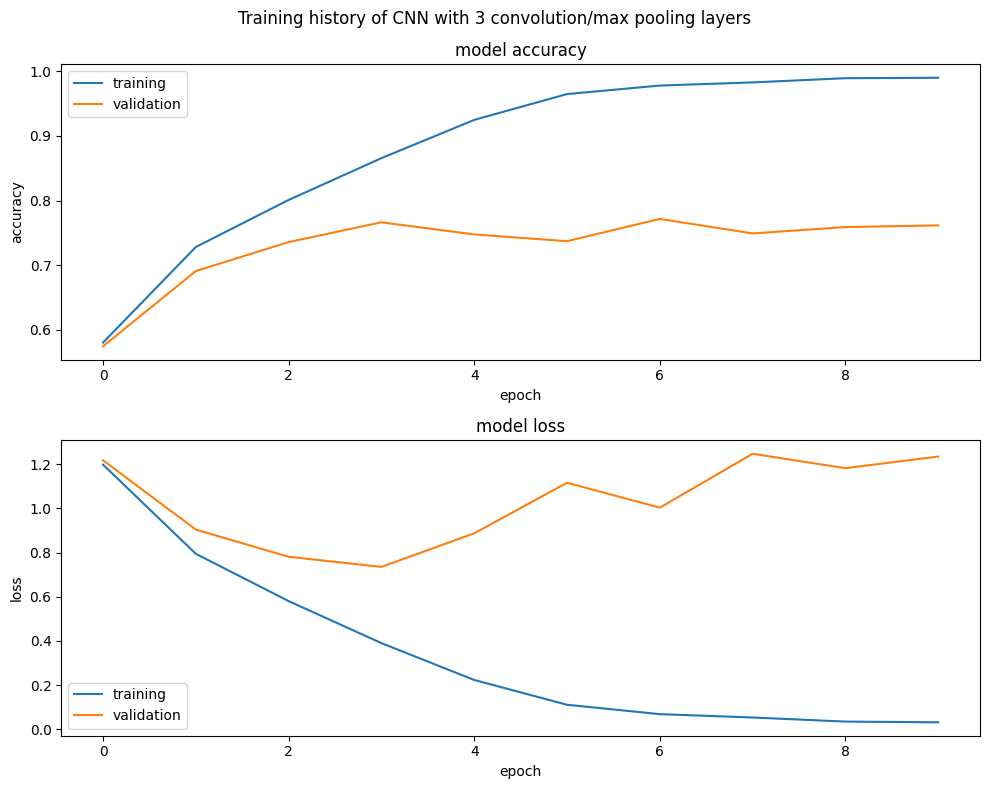

In [ ]:
plt.figure(figsize=(10, 8))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.suptitle('Training history of CNN with 3 convolution/max pooling layers')
plt.tight_layout()

## Experiment 4b: CNN with 3 convolution/max pooling layers regularized

In [ ]:
def build_model(hp):
    model = Sequential([
        Input([32, 32, 3]),
        Conv2D(filters=hp.Int('conv_1_filters', min_value=32, max_value=256, step=32),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Dropout(hp.Float('dropout_1', min_value=0.2, max_value=0.5, step=0.1)),
        Conv2D(filters=hp.Int('conv_2_filters', min_value=64, max_value=512, step=64),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Dropout(hp.Float('dropout_2', min_value=0.2, max_value=0.5, step=0.1)),
        Conv2D(filters=hp.Int('conv_3_filters', min_value=128, max_value=1024, step=128),
               kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
        MaxPool2D((2, 2), strides=2),
        Dropout(hp.Float('dropout_3', min_value=0.2, max_value=0.5, step=0.1)),
        Flatten(),
        Dense(units=hp.Int('dense_units', min_value=128, max_value=512, step=64), kernel_initializer = 'he_normal',
              activation='relu', kernel_regularizer=tf.keras.regularizers.L2(hp.Float('l2_reg', min_value=1e-4, max_value=1e-2, sampling='LOG'))),
        BatchNormalization(),
        Dropout(hp.Float('dropout_4', min_value=0.2, max_value=0.5, step=0.1)),
        Dense(units=10, activation='softmax')
    ])

    model.compile(optimizer='nadam',
                  loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
                  metrics=['accuracy'])
    return model

tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=10,
    factor=3,
    directory='my_dir',
    project_name='cnn_3conv_3pool_regularized_tuning'
)

tuner.search(x_train_norm, y_train_split, epochs=50, validation_data=(x_valid_norm, y_valid_split))

Trial 30 Complete [00h 07m 08s]
val_accuracy: 0.7666000127792358

Best val_accuracy So Far: 0.8119999766349792
Total elapsed time: 01h 55m 48s


In [ ]:
best_hps = tuner.get_best_hyperparameters()[0]

In [ ]:
best_hps.values

{'conv_1_filters': 256,
 'dropout_1': 0.4,
 'conv_2_filters': 448,
 'dropout_2': 0.30000000000000004,
 'conv_3_filters': 1024,
 'dropout_3': 0.4,
 'dense_units': 384,
 'l2_reg': 0.0002574849585348219,
 'dropout_4': 0.30000000000000004,
 'tuner/epochs': 10,
 'tuner/initial_epoch': 0,
 'tuner/bracket': 0,
 'tuner/round': 0}

In [ ]:
Conv_3_Pool_3_reg = Sequential([
  Input([32,32,3]),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.4),
  Conv2D(filters=448, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.3),
  Conv2D(filters=1024, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.4),
  Flatten(),
  Dense(units=384,activation='relu', kernel_initializer = 'he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.000257)),
  BatchNormalization(),
  Dropout(0.3),
  Dense(units=10, activation='softmax')
])

In [ ]:
Conv_3_Pool_3_reg.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 30, 30, 256)    │         7,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 15, 15, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 15, 15, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 13, 13, 448)    │     1,032,640 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 6, 6, 448)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 6, 6, 448)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 4, 4, 1024)     │     4,129,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 2, 2, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 2, 2, 1024)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 4096)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 384)            │     1,573,248 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 384)            │         1,536 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 384)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 10)             │         3,850 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,748,234 (25.74 MB)

 Trainable params: 6,747,466 (25.74 MB)

 Non-trainable params: 768 (3.00 KB)

In [ ]:
Conv_3_Pool_3_reg.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = Conv_3_Pool_3_reg.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=64,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("Conv_3_Pool_3_reg.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )

2025-10-16 21:51:05.404442: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 552960000 exceeds 10% of free system memory.
2025-10-16 21:51:05.784478: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 552960000 exceeds 10% of free system memory.


Epoch 1/200


2025-10-16 21:51:08.910258: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,448,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,256,15,15]{3,2,1,0}, f32[448,256,3,3]{3,2,1,0}, f32[448]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-16 21:51:09.525518: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,1024,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,448,6,6]{3,2,1,0}, f32[1024,448,3,3]{3,2,1,0}, f32[1024]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFo

703/704 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - accuracy: 0.3328 - loss: 2.1509

2025-10-16 21:51:43.698737: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[8,448,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,256,15,15]{3,2,1,0}, f32[448,256,3,3]{3,2,1,0}, f32[448]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kNone","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-16 21:51:43.859646: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[8,1024,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[8,448,6,6]{3,2,1,0}, f32[1024,448,3,3]{3,2,1,0}, f32[1024]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForwar

704/704 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step - accuracy: 0.3329 - loss: 2.1504

2025-10-16 21:51:47.922184: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,448,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,256,15,15]{3,2,1,0}, f32[448,256,3,3]{3,2,1,0}, f32[448]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-16 21:51:48.545235: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[64,1024,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[64,448,6,6]{3,2,1,0}, f32[1024,448,3,3]{3,2,1,0}, f32[1024]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFo

704/704 ━━━━━━━━━━━━━━━━━━━━ 46s 51ms/step - accuracy: 0.4349 - loss: 1.7876 - val_accuracy: 0.5696 - val_loss: 1.3621
Epoch 2/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 29s 41ms/step - accuracy: 0.6232 - loss: 1.2266 - val_accuracy: 0.5920 - val_loss: 1.2868
Epoch 3/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 29s 42ms/step - accuracy: 0.6891 - loss: 1.0299 - val_accuracy: 0.7062 - val_loss: 0.9648
Epoch 4/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 30s 43ms/step - accuracy: 0.7281 - loss: 0.9110 - val_accuracy: 0.7610 - val_loss: 0.8371
Epoch 5/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 30s 42ms/step - accuracy: 0.7580 - loss: 0.8266 - val_accuracy: 0.7646 - val_loss: 0.8124
Epoch 6/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 33s 47ms/step - accuracy: 0.7829 - loss: 0.7602 - val_accuracy: 0.7638 - val_loss: 0.8318
Epoch 7/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 54s 77ms/step - accuracy: 0.8073 - loss: 0.6960 - val_accuracy: 0.7922 - val_loss: 0.7337
Epoch 8/200
704/704 ━━━━━━━━━━━━━━━━━━━━ 61s 86ms/step - accuracy: 0.8263 - loss: 0.6401 - val_

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

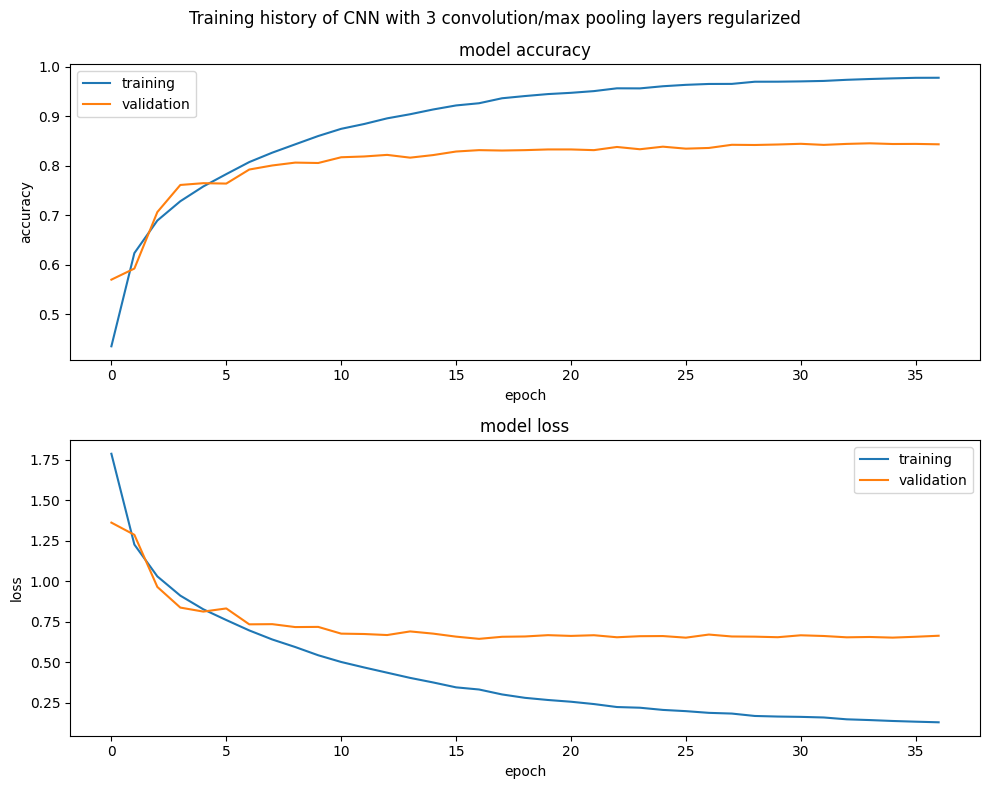

In [ ]:
plt.figure(figsize=(10, 8))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.suptitle('Training history of CNN with 3 convolution/max pooling layers regularized')
plt.tight_layout()

In [ ]:
Conv_3_Pool_3_reg.save('Conv_3_Pool_3_reg.keras')

In [ ]:
Conv_3_Pool_3_reg.load_model('Conv_3_Pool_3_reg.keras')

In [ ]:
pred1= Conv_3_Pool_3_reg.predict(x_test_norm)
pred1=np.argmax(pred1, axis=1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 2s 6ms/step


In [ ]:
print_validation_report(y_test, pred1)

Classification Report
              precision    recall  f1-score   support

           0       0.86      0.85      0.86      1000
           1       0.93      0.92      0.92      1000
           2       0.79      0.74      0.76      1000
           3       0.73      0.67      0.70      1000
           4       0.77      0.86      0.81      1000
           5       0.78      0.76      0.77      1000
           6       0.84      0.90      0.87      1000
           7       0.87      0.86      0.87      1000
           8       0.90      0.92      0.91      1000
           9       0.90      0.90      0.90      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000

Accuracy Score: 0.8377
Root Mean Square Error: 1.5958383376770968


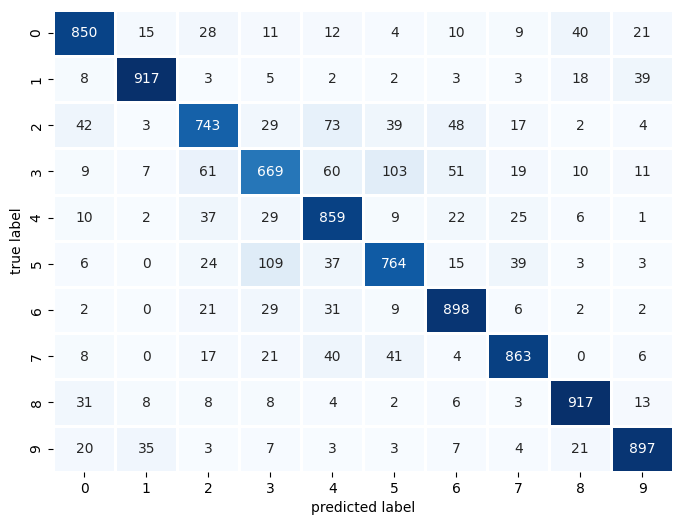

In [ ]:
plot_confusion_matrix(y_test,pred1)

In [ ]:
# Extracts the outputs of the top 8 layers:
layer_outputs = [layer.output for layer in Conv_3_Pool_3_reg.layers[:8]]
# Creates a model that will return these outputs, given the model input:
activation_model = models.Model(inputs=Conv_3_Pool_3_reg.inputs, outputs=layer_outputs)

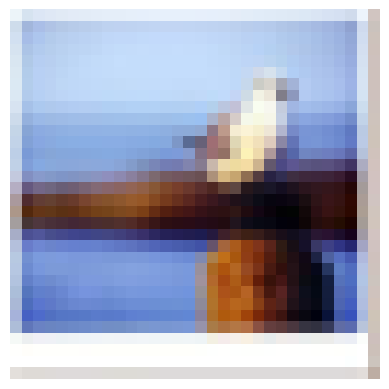

In [ ]:
img = x_train_split[2301]
img_tensor = image.img_to_array(img)
img_tensor = np.expand_dims(img_tensor, axis=0)

plt.imshow(img, cmap='viridis')
plt.axis('off')
plt.show()

In [ ]:
activations = activation_model.predict(img_tensor)
len(activations)

2025-10-11 23:28:50.100072: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[1,448,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,256,15,15]{3,2,1,0}, f32[448,256,3,3]{3,2,1,0}, f32[448]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-11 23:28:50.208270: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[1,1024,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[1,448,6,6]{3,2,1,0}, f32[1024,448,3,3]{3,2,1,0}, f32[1024]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForwar

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


8

In [ ]:
layer_names = []
for layer in Conv_3_Pool_3_reg.layers:
    layer_names.append(layer.name)

layer_names

['conv2d_6',
 'max_pooling2d_6',
 'dropout_8',
 'conv2d_7',
 'max_pooling2d_7',
 'dropout_9',
 'conv2d_8',
 'max_pooling2d_8',
 'dropout_10',
 'flatten_2',
 'dense_4',
 'batch_normalization_2',
 'dropout_11',
 'dense_5']

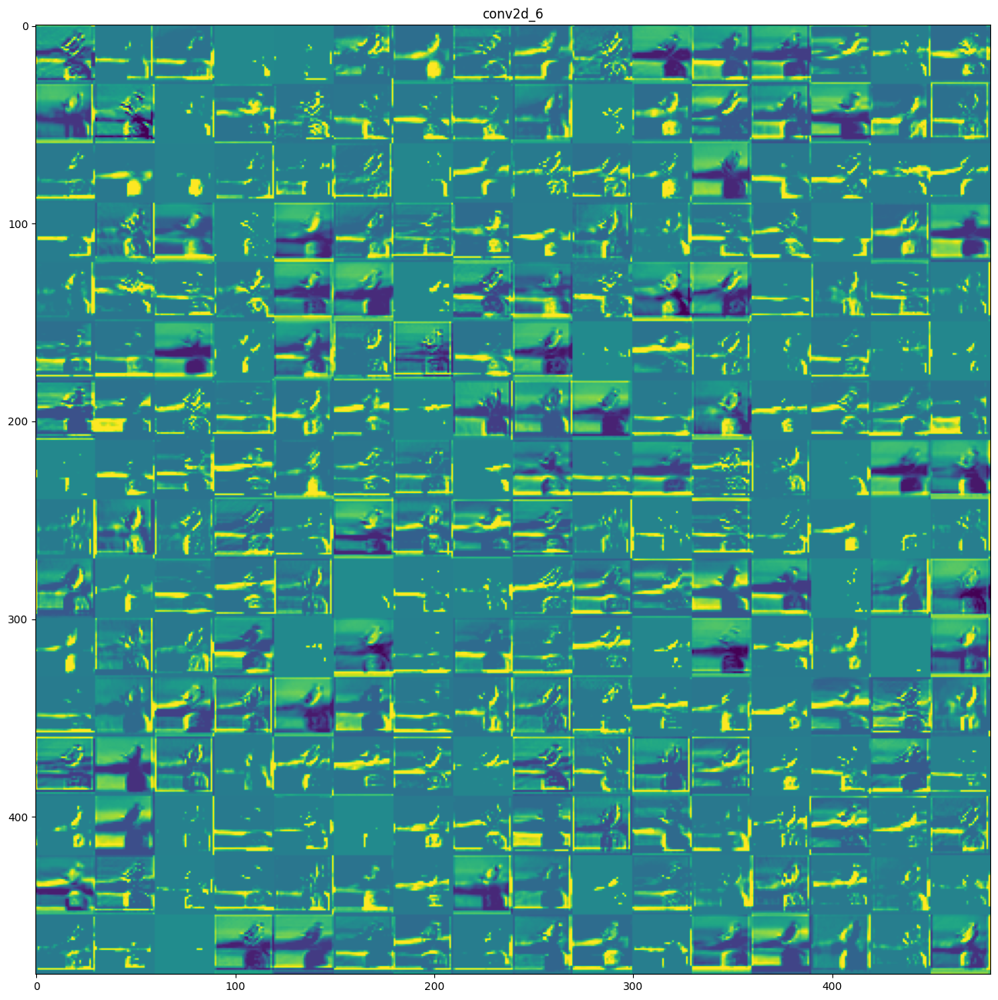

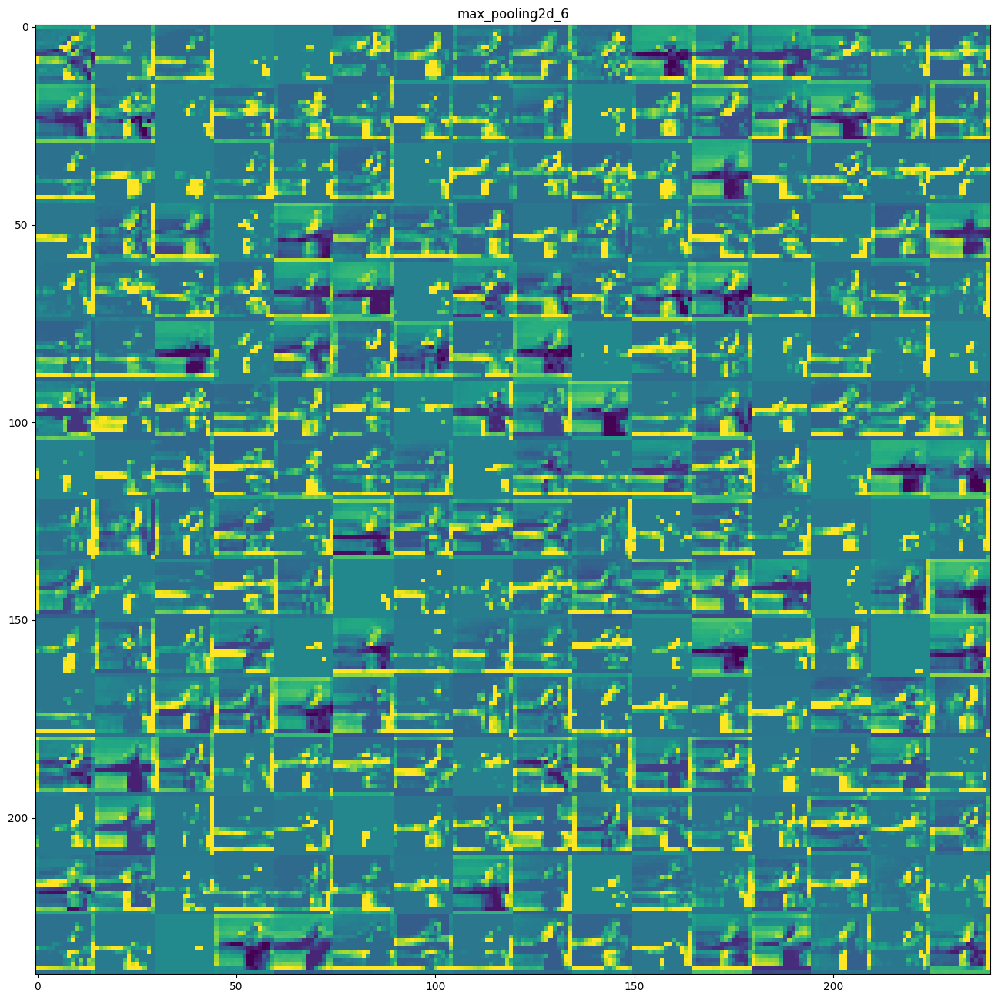

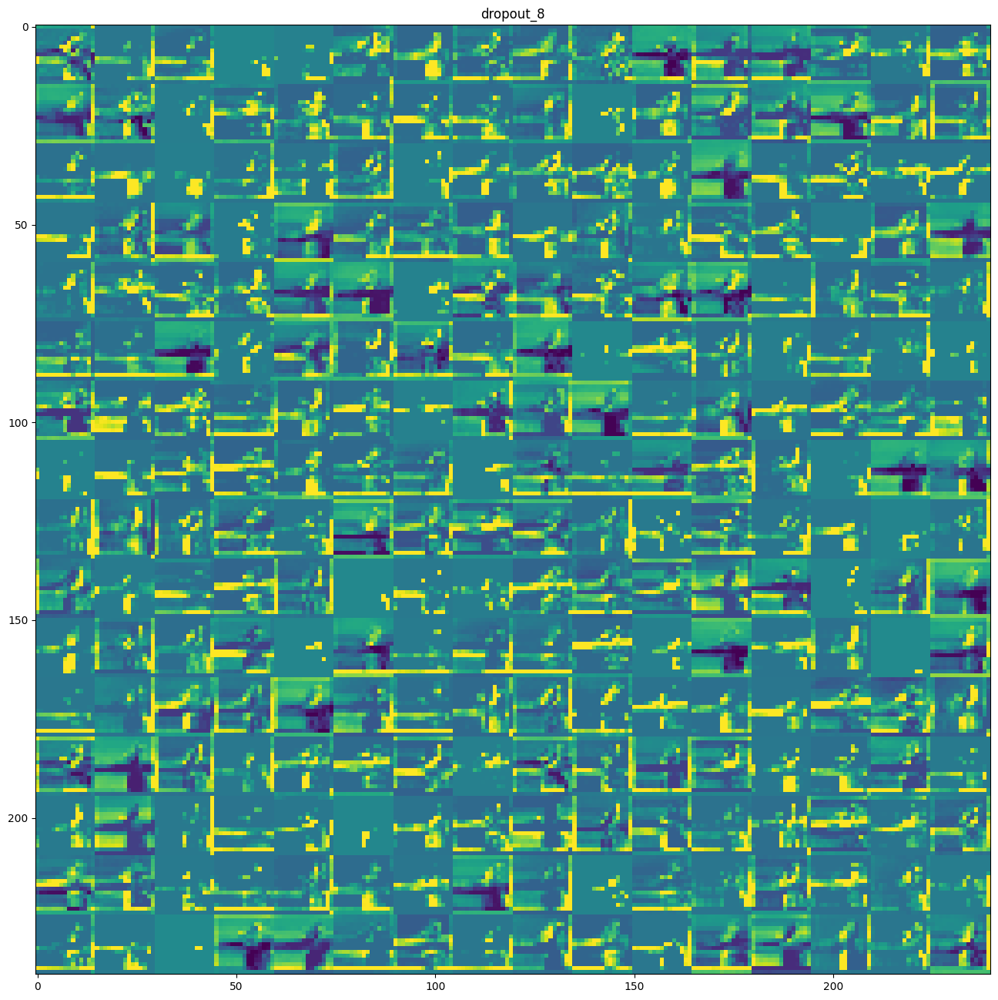

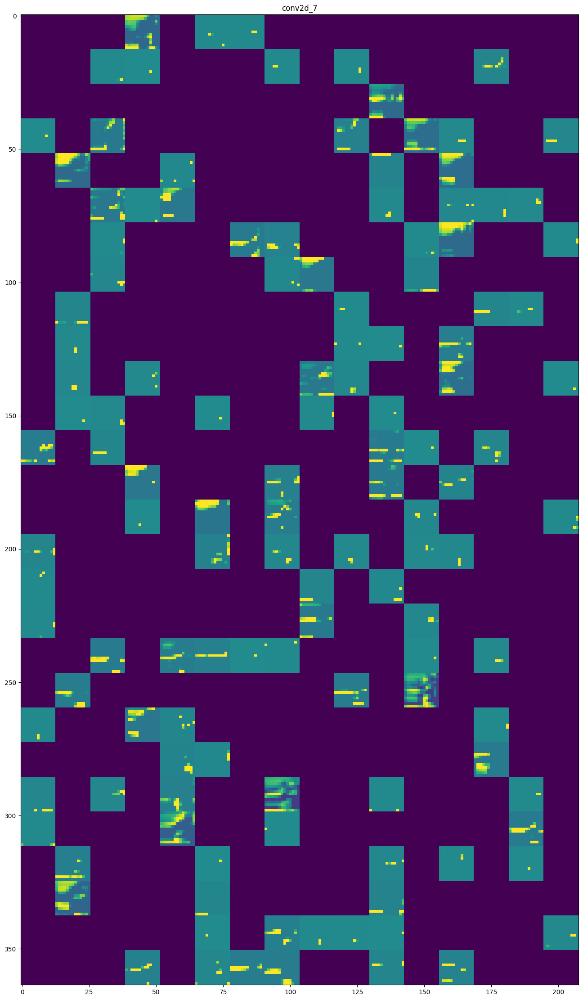

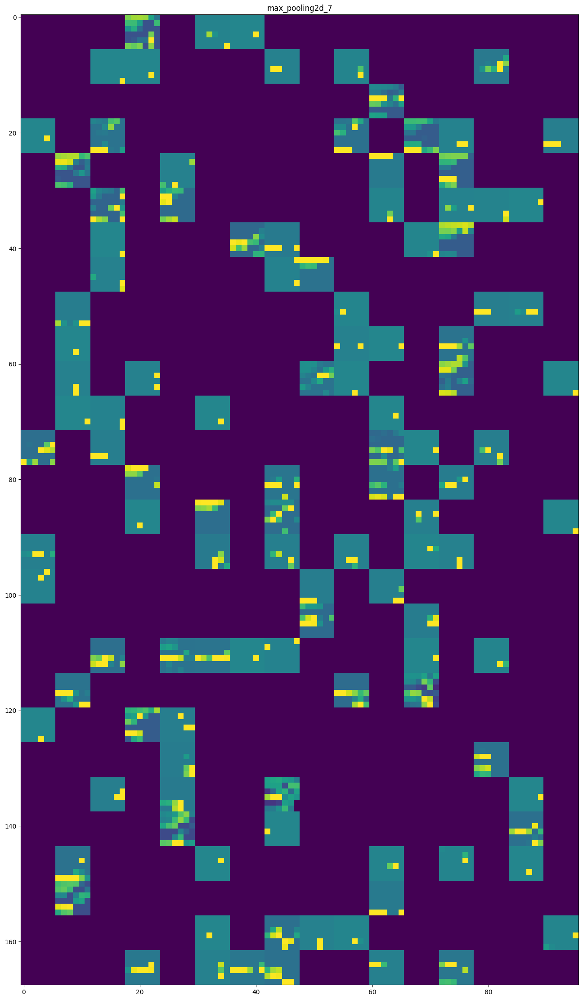

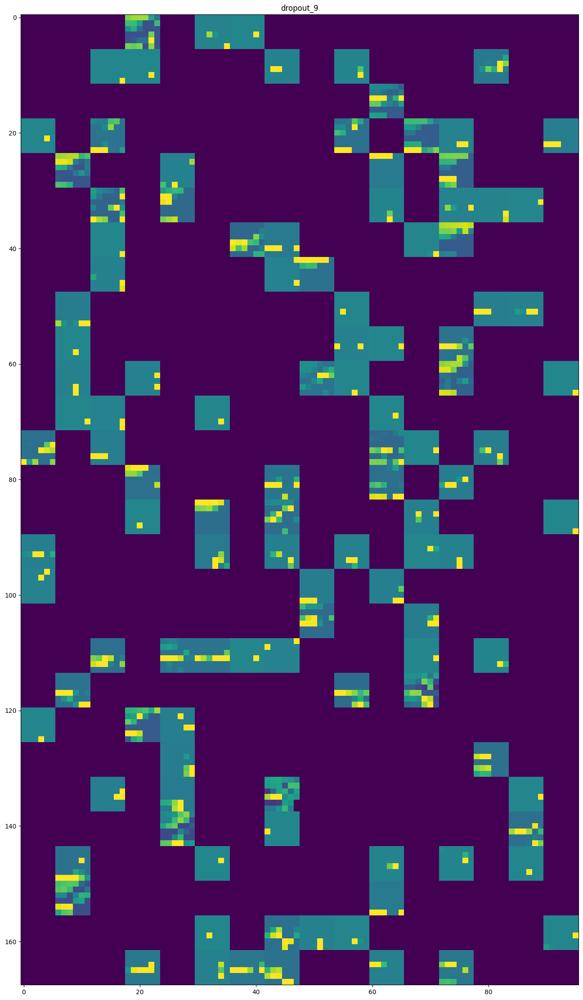

In [ ]:
layer_names = []
for layer in Conv_3_Pool_3_reg.layers[:6]:
    layer_names.append(layer.name)

images_per_row = 16

# Now let's display our feature maps
for layer_name, layer_activation in zip(layer_names, activations):
    # This is the number of features in the feature map
    n_features = layer_activation.shape[-1]

    # The feature map has shape (1, size, size, n_features)
    size = layer_activation.shape[1]

    # We will tile the activation channels in this matrix
    n_cols = n_features // images_per_row
    display_grid = np.zeros((size * n_cols, images_per_row * size))

    # We'll tile each filter into this big horizontal grid
    for col in range(n_cols):
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            # Post-process the feature to make it visually palatable
            channel_image -= channel_image.mean()
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size,
                         row * size : (row + 1) * size] = channel_image

    # Display the grid
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')

plt.show();

In [ ]:
layer_name = 'dense_2'
layer_output = Conv_3_Pool_3_reg.get_layer(layer_name).output
intermediate_model = models.Model(
    inputs=Conv_3_Pool_3_reg.inputs, outputs=layer_output
)
activations = intermediate_model.predict(x_test_norm)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 7ms/step


In [ ]:
activation_data = {}
for k in range(0,384):
    activation_data[f"act_val_{k}"] = activations[:,k]

activation_df = pd.DataFrame(activation_data)
activation_df.head(15).round(3).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
act_val_0,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000
act_val_1,0.124,0.257,0.000,0.138,0.000,0.000,0.000,0.000,0.000,0.000,0.258,0.000,0.000,0.000,0.000
act_val_2,0.000,0.681,0.416,0.327,0.000,0.000,0.368,0.000,0.000,0.515,0.000,1.037,0.000,0.000,0.684
act_val_3,0.523,0.000,0.341,0.000,0.361,0.679,0.000,1.153,0.910,0.000,0.000,0.000,0.187,0.000,0.000
act_val_4,0.000,0.797,0.433,2.005,0.000,0.000,0.000,0.015,0.000,0.000,0.912,0.000,0.000,0.000,0.000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
act_val_379,1.350,0.835,0.417,0.000,0.000,0.764,0.000,0.328,1.005,0.246,0.449,2.099,0.186,0.000,0.964
act_val_380,0.000,0.880,0.351,0.000,0.527,0.000,0.000,0.000,0.000,0.000,0.109,0.000,0.000,0.000,0.559
act_val_381,0.000,0.414,0.231,0.000,0.000,0.000,0.693,0.000,0.000,0.800,0.000,1.488,0.000,0.000,0.958
act_val_382,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000


In [ ]:
%%time
tsne = TSNE(n_components=2
            ,init='pca'
            ,learning_rate='auto'
            ,verbose=0
            ,perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(activation_df)

CPU times: user 41.6 s, sys: 0 ns, total: 41.6 s
Wall time: 41.4 s


In [ ]:
tsne_results = (tsne_results - tsne_results.min()) / (tsne_results.max() - tsne_results.min())

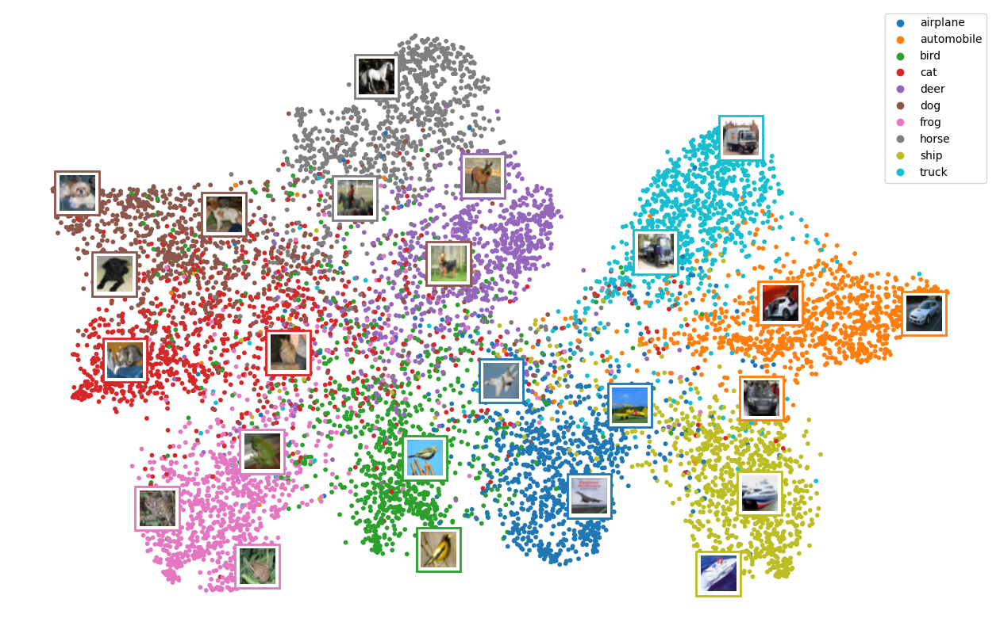

In [ ]:
cmap = plt.cm.tab10
plt.figure(figsize=(16,10))
scatter=plt.scatter(tsne_results[:,0],tsne_results[:,1], c=y_test, s=10, cmap=cmap)
plt.legend(handles=scatter.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_test[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_test[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

## Experiment 9: ResNet

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras.models import Model

class ResidualBlock(layers.Layer):
    def __init__(self, filters, stride=1):
        super(ResidualBlock, self).__init__()
        self.conv1 = layers.Conv2D(filters, kernel_size=3, strides=stride, use_bias=False,padding='same', kernel_initializer='he_normal')
        self.bn1 = layers.BatchNormalization()
        self.relu = layers.ReLU()
        self.conv2 = layers.Conv2D(filters, kernel_size=3, use_bias=False,strides=1, padding='same', kernel_initializer='he_normal')
        self.bn2 = layers.BatchNormalization()

        self.shortcut = tf.identity

        if stride != 1:
            self.shortcut = Sequential([layers.Conv2D(filters, kernel_size=1, strides=stride, padding='same',use_bias=False, kernel_initializer='he_normal'),
                                       layers.BatchNormalization()])


    def call(self, inputs):
        x = self.conv1(inputs)
        x = self.bn1(x)
        x = self.relu(x)
        x = self.conv2(x)
        x = self.bn2(x)
        x += self.shortcut(inputs)
        x = self.relu(x)
        return x

In [ ]:
def build_resnet():
    inputs = tf.keras.Input([32,32,3])

    x = layers.Conv2D(64, kernel_size=3, strides=1, padding='same',use_bias=False, kernel_initializer='he_normal')(inputs)
    x = layers.BatchNormalization()(x)
    x = layers.ReLU()(x)

    for _ in range(3):
        x = ResidualBlock(filters=64, stride=1)(x)

    x = ResidualBlock(filters=128, stride=2)(x)
    for _ in range(2):
        x = ResidualBlock(filters=128, stride=1)(x)

    x = ResidualBlock(filters=256, stride=2)(x)
    for _ in range(2):
        x = ResidualBlock(filters=256, stride=1)(x)

    x = layers.GlobalAveragePooling2D()(x)

    outputs = layers.Dense(10, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)
    return model

resnet = build_resnet()

resnet.summary()

Model: "functional_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 32, 32, 3)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_6 (Conv2D)               │ (None, 32, 32, 64)     │         1,728 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 32, 32, 64)     │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ re_lu (ReLU)                    │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block (ResidualBlock)  │ (None, 32, 32, 64)     │        74,240 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_1                │ (None, 32, 32, 64)     │        74,240 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_2                │ (None, 32, 32, 64)     │        74,240 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_3                │ (None, 16, 16, 128)    │       230,912 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_4                │ (None, 16, 16, 128)    │       295,936 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_5                │ (None, 16, 16, 128)    │       295,936 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_6                │ (None, 8, 8, 256)      │       920,576 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_7                │ (None, 8, 8, 256)      │     1,181,696 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ residual_block_8                │ (None, 8, 8, 256)      │     1,181,696 │
│ (ResidualBlock)                 │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 256)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 10)             │         2,570 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,334,026 (16.53 MB)

 Trainable params: 4,327,754 (16.51 MB)

 Non-trainable params: 6,272 (24.50 KB)

In [ ]:
resnet.compile(optimizer=tf.keras.optimizers.Nadam(learning_rate=lr_schedule),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = resnet.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=128,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("resnet.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )


Epoch 1/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 89s 195ms/step - accuracy: 0.5931 - loss: 1.1432 - val_accuracy: 0.5090 - val_loss: 1.6956
Epoch 2/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 60s 172ms/step - accuracy: 0.7648 - loss: 0.6738 - val_accuracy: 0.7208 - val_loss: 0.8151
Epoch 3/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 112s 319ms/step - accuracy: 0.8231 - loss: 0.5008 - val_accuracy: 0.6290 - val_loss: 1.2735
Epoch 4/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 136s 386ms/step - accuracy: 0.8668 - loss: 0.3826 - val_accuracy: 0.7028 - val_loss: 0.9847
Epoch 5/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 180s 513ms/step - accuracy: 0.9014 - loss: 0.2839 - val_accuracy: 0.7582 - val_loss: 0.7676
Epoch 6/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 199s 565ms/step - accuracy: 0.9298 - loss: 0.1987 - val_accuracy: 0.6860 - val_loss: 1.3833
Epoch 7/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 204s 581ms/step - accuracy: 0.9506 - loss: 0.1427 - val_accuracy: 0.6832 - val_loss: 1.4986
Epoch 8/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 205s 581ms/step - accuracy: 0.

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

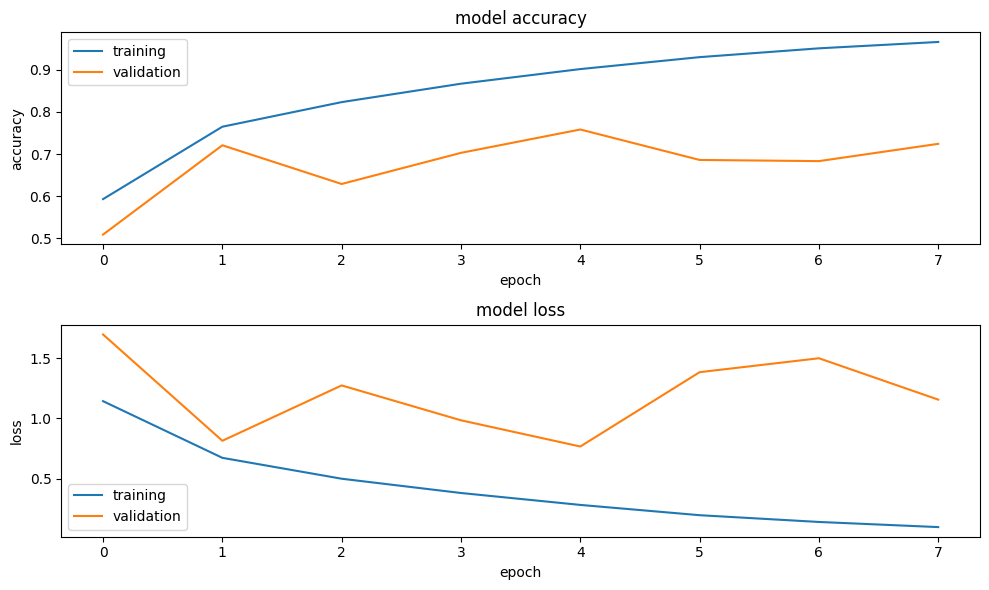

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
pred1= resnet.predict(x_test_norm)
pred1=np.argmax(pred1, axis=1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 8s 19ms/step


In [ ]:
print_validation_report(y_test, pred1)

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.70      0.78      1000
           1       0.51      0.98      0.67      1000
           2       0.67      0.78      0.72      1000
           3       0.74      0.50      0.60      1000
           4       0.84      0.70      0.76      1000
           5       0.74      0.68      0.71      1000
           6       0.95      0.59      0.73      1000
           7       0.95      0.56      0.70      1000
           8       0.89      0.85      0.87      1000
           9       0.58      0.88      0.70      1000

    accuracy                           0.72     10000
   macro avg       0.77      0.72      0.72     10000
weighted avg       0.77      0.72      0.72     10000

Accuracy Score: 0.7233
Root Mean Square Error: 2.330986915450192


In [ ]:
resnet_sgd = build_resnet()
resnet_sgd.compile(optimizer=tf.keras.optimizers.SGD(momentum=0.9, weight_decay=0.0001, learning_rate=0.1),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = resnet_sgd.fit(x_train_norm,
                    y_train_split,
                    epochs=200,
                    batch_size=128,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("resnet_sgd.keras",save_best_only=True,save_weights_only=False),
                     tf.keras.callbacks.EarlyStopping(monitor='val_accuracy', patience=3),
                    ]
                   )


Epoch 1/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 68s 170ms/step - accuracy: 0.3602 - loss: 1.8070 - val_accuracy: 0.3546 - val_loss: 1.9075
Epoch 2/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 80s 226ms/step - accuracy: 0.5812 - loss: 1.1538 - val_accuracy: 0.5678 - val_loss: 1.2265
Epoch 3/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 142s 403ms/step - accuracy: 0.6886 - loss: 0.8759 - val_accuracy: 0.6102 - val_loss: 1.2894
Epoch 4/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 196s 557ms/step - accuracy: 0.7510 - loss: 0.7067 - val_accuracy: 0.7322 - val_loss: 0.7508
Epoch 5/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 201s 572ms/step - accuracy: 0.8025 - loss: 0.5653 - val_accuracy: 0.7554 - val_loss: 0.7119
Epoch 6/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 201s 572ms/step - accuracy: 0.8378 - loss: 0.4617 - val_accuracy: 0.7530 - val_loss: 0.7044
Epoch 7/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 201s 571ms/step - accuracy: 0.8688 - loss: 0.3766 - val_accuracy: 0.7608 - val_loss: 0.7445
Epoch 8/200
352/352 ━━━━━━━━━━━━━━━━━━━━ 201s 572ms/step - accuracy: 0.

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

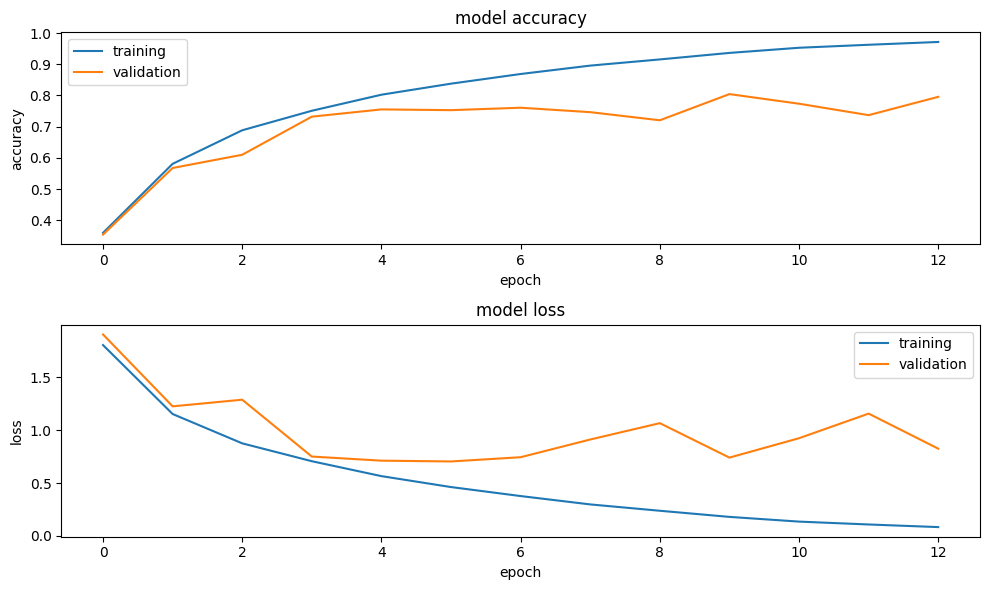

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
pred1= resnet_sgd.predict(x_test_norm)
pred1=np.argmax(pred1, axis=1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step


In [ ]:
print_validation_report(y_test, pred1)

Classification Report
              precision    recall  f1-score   support

           0       0.90      0.77      0.83      1000
           1       0.98      0.78      0.87      1000
           2       0.73      0.76      0.74      1000
           3       0.60      0.73      0.66      1000
           4       0.81      0.80      0.80      1000
           5       0.63      0.81      0.71      1000
           6       0.97      0.63      0.77      1000
           7       0.83      0.87      0.85      1000
           8       0.90      0.92      0.91      1000
           9       0.84      0.91      0.87      1000

    accuracy                           0.80     10000
   macro avg       0.82      0.80      0.80     10000
weighted avg       0.82      0.80      0.80     10000

Accuracy Score: 0.7983
Root Mean Square Error: 1.7926237753639216


In [ ]:
resnet2 = build_resnet()

In [ ]:
resnet2.compile(optimizer=tf.keras.optimizers.SGD(momentum=0.9, weight_decay=0.0001, learning_rate=0.1),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = resnet2.fit(x_train_norm,
                    y_train_split,
                    epochs=90,
                    batch_size=128,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("resnet2.keras",save_best_only=True,save_weights_only=False),
                    ]
                   )


Epoch 1/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 67s 169ms/step - accuracy: 0.3834 - loss: 1.7942 - val_accuracy: 0.4560 - val_loss: 1.4639
Epoch 2/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 89s 252ms/step - accuracy: 0.5973 - loss: 1.1173 - val_accuracy: 0.5176 - val_loss: 1.3642
Epoch 3/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 182s 517ms/step - accuracy: 0.7039 - loss: 0.8294 - val_accuracy: 0.6732 - val_loss: 0.9744
Epoch 4/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 202s 574ms/step - accuracy: 0.7781 - loss: 0.6340 - val_accuracy: 0.6900 - val_loss: 0.9164
Epoch 5/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 203s 577ms/step - accuracy: 0.8243 - loss: 0.5014 - val_accuracy: 0.7576 - val_loss: 0.7107
Epoch 6/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 216s 614ms/step - accuracy: 0.8595 - loss: 0.4053 - val_accuracy: 0.7640 - val_loss: 0.7603
Epoch 7/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 226s 642ms/step - accuracy: 0.8845 - loss: 0.3267 - val_accuracy: 0.7164 - val_loss: 1.0282
Epoch 8/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 229s 651ms/step - accuracy: 0.9059 - l

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

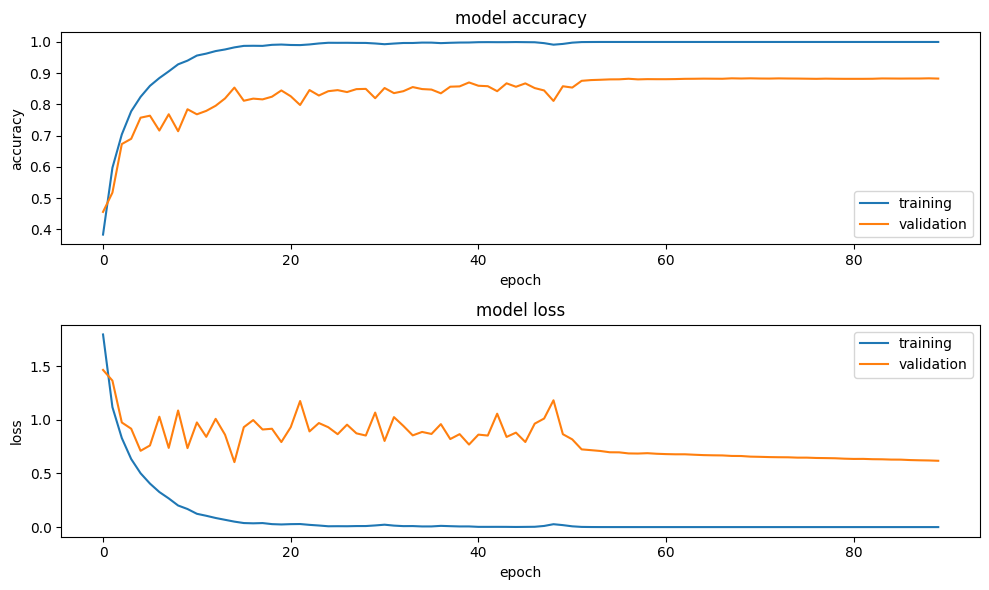

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
history = resnet2.fit(x_train_norm,
                    y_train_split,
                    epochs=1,
                    batch_size=128,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("resnet2.keras",save_best_only=True,save_weights_only=False),
                    ]
                   )

352/352 ━━━━━━━━━━━━━━━━━━━━ 40s 114ms/step - accuracy: 1.0000 - loss: 4.9501e-05 - val_accuracy: 0.8828 - val_loss: 0.6452


In [ ]:
resnet2.save('resnet2.keras')

In [ ]:
resnet2.load_weights('resnet2.keras')

In [ ]:
pred1= resnet2.predict(x_test_norm)
pred1=np.argmax(pred1, axis=1)

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 10ms/step


In [ ]:
print_validation_report(y_test, pred1)

Classification Report
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      1000
           1       0.94      0.94      0.94      1000
           2       0.84      0.79      0.81      1000
           3       0.77      0.74      0.75      1000
           4       0.86      0.87      0.86      1000
           5       0.83      0.81      0.82      1000
           6       0.88      0.93      0.90      1000
           7       0.91      0.92      0.92      1000
           8       0.93      0.94      0.93      1000
           9       0.92      0.93      0.92      1000

    accuracy                           0.88     10000
   macro avg       0.88      0.88      0.88     10000
weighted avg       0.88      0.88      0.88     10000

Accuracy Score: 0.8761
Root Mean Square Error: 1.4248157775656474


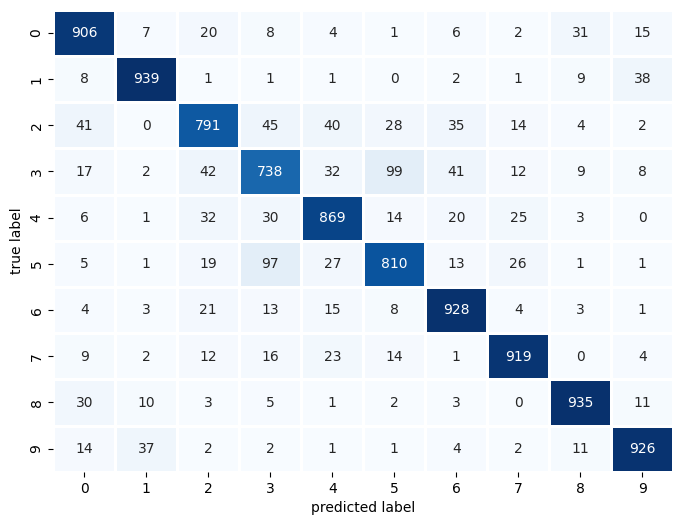

In [ ]:
plot_confusion_matrix(y_test,pred1)

In [ ]:
layer_name = 'global_average_pooling2d_1'
layer_output = resnet2.get_layer(layer_name).output
intermediate_model = models.Model(
    inputs=resnet2.inputs, outputs=layer_output
)
activations = intermediate_model.predict(x_test_norm)

313/313 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step


In [ ]:
activation_data = {}
for k in range(0,256):
    activation_data[f"act_val_{k}"] = activations[:,k]

activation_df = pd.DataFrame(activation_data)
activation_df.head(15).round(3).T

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
act_val_0,0.067,0.327,0.265,0.136,0.092,0.046,0.090,0.323,0.324,0.189,0.384,0.437,0.468,0.505,0.387
act_val_1,0.204,0.239,0.384,0.470,0.146,0.008,0.370,0.187,0.052,0.211,0.123,0.245,0.002,0.019,0.498
act_val_2,0.484,1.233,0.256,0.235,0.142,0.168,0.081,0.033,0.180,0.179,0.622,0.063,0.402,0.062,0.041
act_val_3,0.583,0.098,0.000,0.074,0.995,0.989,0.041,0.738,1.039,0.034,0.230,0.062,0.280,0.044,0.135
act_val_4,0.081,0.008,0.020,0.582,0.034,0.325,0.328,0.424,0.341,0.172,0.739,0.689,0.361,1.061,0.150
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
act_val_251,0.001,0.167,0.278,0.396,0.207,0.013,0.092,0.222,0.127,0.560,0.700,0.457,0.203,0.074,0.448
act_val_252,0.031,0.071,0.229,0.182,0.490,0.270,0.496,0.353,0.088,0.405,0.025,0.290,0.219,1.737,0.538
act_val_253,0.199,0.555,0.334,0.034,0.146,0.090,0.227,0.008,0.044,0.347,0.044,0.662,0.081,0.157,0.572
act_val_254,0.332,0.989,0.432,0.610,0.077,0.034,0.096,0.375,0.064,0.144,0.974,0.129,0.090,0.018,0.063


In [ ]:
%%time
tsne = TSNE(n_components=2
            ,init='pca'
            ,learning_rate='auto'
            ,verbose=0
            ,perplexity=40, n_iter=300)
tsne_results = tsne.fit_transform(activation_df)

CPU times: user 37.3 s, sys: 0 ns, total: 37.3 s
Wall time: 37.8 s


In [ ]:
tsne_results = (tsne_results - tsne_results.min()) / (tsne_results.max() - tsne_results.min())

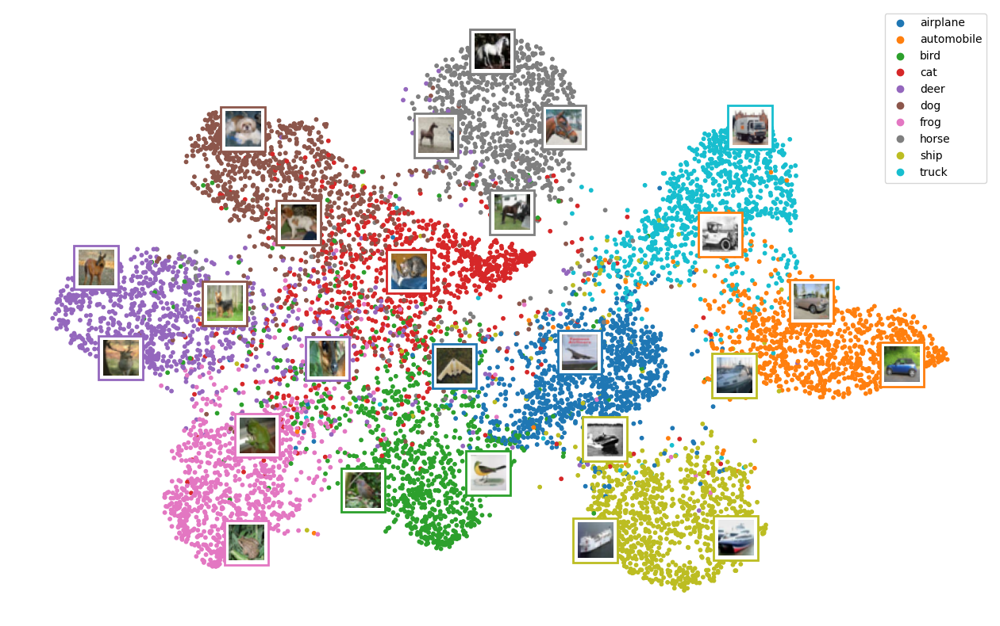

In [ ]:
cmap = plt.cm.tab10
plt.figure(figsize=(16,10))
scatter=plt.scatter(tsne_results[:,0],tsne_results[:,1], c=y_test, s=10, cmap=cmap)
plt.legend(handles=scatter.legend_elements()[0], labels=class_names)

image_positions = np.array([[1., 1.]])
for index, position in enumerate(tsne_results):
    dist = np.sum((position - image_positions) ** 2, axis=1)
    if np.min(dist) > 0.02: # if far enough from other images
        image_positions = np.r_[image_positions, [position]]
        imagebox = mpl.offsetbox.AnnotationBbox(
            mpl.offsetbox.OffsetImage(x_test[index], cmap="binary"),
            position, bboxprops={"edgecolor": cmap(y_test[index]), "lw": 2})
        plt.gca().add_artist(imagebox)
plt.axis("off")
plt.show()

In [ ]:
DNN_3_layers_reg_long_train = Sequential([
  Input(shape=(32, 32, 3)),
  Flatten(),
  Dense(units=350, activation='relu', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.00039)),
  Dense(units=150, activation='relu', kernel_initializer='he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.00086)),
  Dense(units=10, activation='softmax')
])

In [ ]:
DNN_3_layers_reg_long_train.compile(optimizer=tf.keras.optimizers.SGD(momentum=0.9, weight_decay=0.0001, learning_rate=0.1),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
%%time
history = DNN_3_layers_reg_long_train.fit(x_train_norm,
                    y_train_split,
                    epochs=90,
                    batch_size=128,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("DNN_3_layers_reg_long_train.keras",save_best_only=True,save_weights_only=False),
                    ]
                   )

2025-10-13 08:34:19.586995: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 552960000 exceeds 10% of free system memory.
2025-10-13 08:34:19.963992: W external/local_xla/xla/tsl/framework/cpu_allocator_impl.cc:84] Allocation of 552960000 exceeds 10% of free system memory.


Epoch 1/90


2025-10-13 08:34:20.773896: I external/local_xla/xla/service/service.cc:163] XLA service 0x7f09dc002390 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-10-13 08:34:20.773915: I external/local_xla/xla/service/service.cc:171]   StreamExecutor device (0): NVIDIA GeForce GTX 1060, Compute Capability 6.1
2025-10-13 08:34:20.811548: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2025-10-13 08:34:20.867600: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:473] Loaded cuDNN version 90300


 56/352 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.2792 - loss: 2.5580

I0000 00:00:1760362461.662963  147449 device_compiler.h:196] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


352/352 ━━━━━━━━━━━━━━━━━━━━ 4s 8ms/step - accuracy: 0.4016 - loss: 2.0988 - val_accuracy: 0.4268 - val_loss: 1.9231
Epoch 2/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4632 - loss: 1.7830 - val_accuracy: 0.4350 - val_loss: 1.8159
Epoch 3/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.4887 - loss: 1.6648 - val_accuracy: 0.4802 - val_loss: 1.6901
Epoch 4/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5071 - loss: 1.6043 - val_accuracy: 0.4864 - val_loss: 1.6757
Epoch 5/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5220 - loss: 1.5742 - val_accuracy: 0.4772 - val_loss: 1.7096
Epoch 6/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5339 - loss: 1.5496 - val_accuracy: 0.4972 - val_loss: 1.6931
Epoch 7/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5408 - loss: 1.5363 - val_accuracy: 0.4926 - val_loss: 1.6969
Epoch 8/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.5501 - loss: 1.5275 - val_accuracy: 0.4888 - val_

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

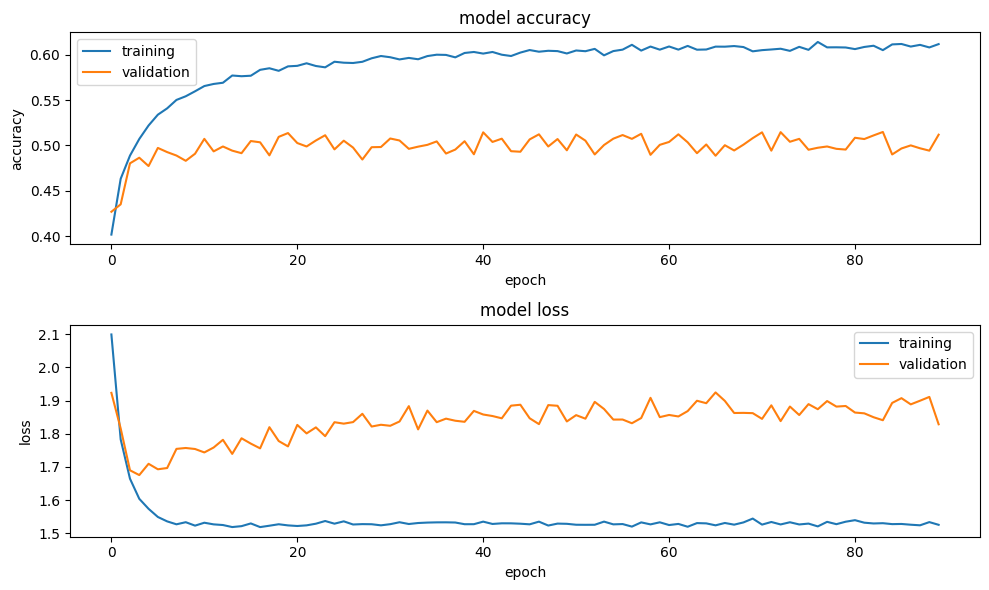

In [ ]:
plt.figure(figsize=(10, 6))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.tight_layout()

In [ ]:
preds = DNN_3_layers_reg_long_train.predict(x_test_norm)
print('shape of preds: ', preds.shape)

313/313 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step
shape of preds:  (10000, 10)


In [ ]:
preds=np.argmax(preds, axis=1)

In [ ]:
print_validation_report(y_test, preds)

Classification Report
              precision    recall  f1-score   support

           0       0.59      0.59      0.59      1000
           1       0.64      0.63      0.64      1000
           2       0.43      0.37      0.40      1000
           3       0.34      0.39      0.36      1000
           4       0.43      0.48      0.45      1000
           5       0.47      0.35      0.40      1000
           6       0.54      0.61      0.57      1000
           7       0.65      0.56      0.60      1000
           8       0.61      0.68      0.65      1000
           9       0.57      0.58      0.57      1000

    accuracy                           0.52     10000
   macro avg       0.53      0.52      0.52     10000
weighted avg       0.53      0.52      0.52     10000

Accuracy Score: 0.5242
Root Mean Square Error: 2.965231862772286


In [ ]:
Conv_3_Pool_3_reg_long_train = Sequential([
  Input([32,32,3]),
  Conv2D(filters=256, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.4),
  Conv2D(filters=448, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.3),
  Conv2D(filters=1024, kernel_size=(3, 3), strides=(1, 1), activation='relu', kernel_initializer = 'he_normal'),
  MaxPool2D((2, 2),strides=2),
  Dropout(0.4),
  Flatten(),
  Dense(units=384,activation='relu', kernel_initializer = 'he_normal', kernel_regularizer=tf.keras.regularizers.L2(0.000257)),
  BatchNormalization(),
  Dropout(0.3),
  Dense(units=10, activation='softmax')
])

In [ ]:
Conv_3_Pool_3_reg_long_train.compile(optimizer=tf.keras.optimizers.SGD(momentum=0.9, weight_decay=0.0001, learning_rate=0.1),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=False),
              metrics=['accuracy'])

In [ ]:
history = Conv_3_Pool_3_reg_long_train.fit(x_train_norm,
                    y_train_split,
                    epochs=90,
                    batch_size=128,
                    validation_data=(x_valid_norm, y_valid_split),
                    callbacks=[
                     tf.keras.callbacks.ModelCheckpoint("Conv_3_Pool_3_reg_long_train.keras",save_best_only=True,save_weights_only=False),
                    ]
                   )

Epoch 1/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 35s 85ms/step - accuracy: 0.3088 - loss: 2.3202 - val_accuracy: 0.0990 - val_loss: 3.8466
Epoch 2/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 27s 77ms/step - accuracy: 0.4819 - loss: 1.7262 - val_accuracy: 0.2594 - val_loss: 2.3562
Epoch 3/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 48s 136ms/step - accuracy: 0.5804 - loss: 1.4135 - val_accuracy: 0.6350 - val_loss: 1.2664
Epoch 4/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 55s 156ms/step - accuracy: 0.6486 - loss: 1.1960 - val_accuracy: 0.6108 - val_loss: 1.2583
Epoch 5/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 55s 155ms/step - accuracy: 0.6868 - loss: 1.0589 - val_accuracy: 0.6812 - val_loss: 1.0827
Epoch 6/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 60s 171ms/step - accuracy: 0.7185 - loss: 0.9594 - val_accuracy: 0.7188 - val_loss: 0.9343
Epoch 7/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 71s 201ms/step - accuracy: 0.7415 - loss: 0.8830 - val_accuracy: 0.7352 - val_loss: 0.9014
Epoch 8/90
352/352 ━━━━━━━━━━━━━━━━━━━━ 73s 208ms/step - accuracy: 0.7559 - loss: 0.8

In [ ]:
history_dict = history.history
history_df=pd.DataFrame(history_dict)

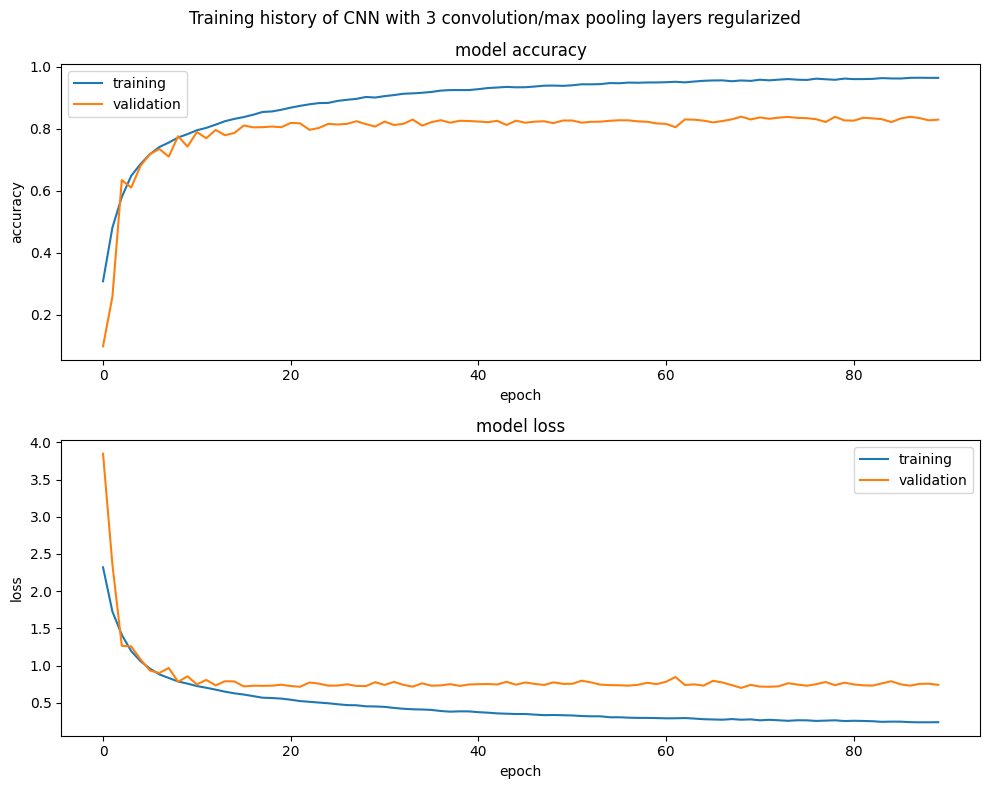

In [ ]:
plt.figure(figsize=(10, 8))
display_training_curves(history_df['accuracy'], history_df['val_accuracy'], 'accuracy', 211)
display_training_curves(history_df['loss'], history_df['val_loss'], 'loss', 212)
plt.suptitle('Training history of CNN with 3 convolution/max pooling layers regularized')
plt.tight_layout()

In [ ]:
pred1= Conv_3_Pool_3_reg.predict(x_test_norm)
pred1=np.argmax(pred1, axis=1)

305/313 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step

2025-10-11 23:26:35.111813: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[16,448,13,13]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,256,15,15]{3,2,1,0}, f32[448,256,3,3]{3,2,1,0}, f32[448]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationForward", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"activation_mode":"kRelu","conv_result_scale":1,"side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]}
2025-10-11 23:26:35.304731: I external/local_xla/xla/service/gpu/autotuning/conv_algorithm_picker.cc:546] Omitted potentially buggy algorithm eng14{} for conv (f32[16,1024,4,4]{3,2,1,0}, u8[0]{0}) custom-call(f32[16,448,6,6]{3,2,1,0}, f32[1024,448,3,3]{3,2,1,0}, f32[1024]{0}), window={size=3x3}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBiasActivationFo

313/313 ━━━━━━━━━━━━━━━━━━━━ 3s 9ms/step


In [ ]:
print_validation_report(y_test, pred1)

Classification Report
              precision    recall  f1-score   support

           0       0.85      0.85      0.85      1000
           1       0.95      0.89      0.92      1000
           2       0.78      0.75      0.76      1000
           3       0.73      0.68      0.70      1000
           4       0.75      0.87      0.81      1000
           5       0.79      0.77      0.78      1000
           6       0.84      0.91      0.87      1000
           7       0.89      0.83      0.86      1000
           8       0.89      0.91      0.90      1000
           9       0.89      0.90      0.89      1000

    accuracy                           0.84     10000
   macro avg       0.84      0.84      0.84     10000
weighted avg       0.84      0.84      0.84     10000

Accuracy Score: 0.836
Root Mean Square Error: 1.6406401189779556
